# Unsupervised Learning 

## 1. Objective

This project explores the various clustering algorithms for segmenting information using various helpful packages in `Python`. Models applied in the analysis to cluster high dimensional data included the **K-Means**, **Bisecting K-Means**, **Gaussian Mixture**, **Agglomerative** and **Ward Hierarchical** clustering algorithms. All results were consolidated in and presented at the end of the document.

## 1.1. Data Definition

Datasets used for the analysis were separately gathered and consolidated from various sources including: 
1. Cancer Deaths by Type from [OurWorldInData.Org](https://ourworldindata.org/cancer) as obtained from the [Institute for Health Metrics and Evaluation](http://ghdx.healthdata.org/gbd-results-tool)
2. Prevalence of Overweight among Adults from [OurWorldInData.Org](https://ourworldindata.org/obesity) as obtained from [WHO, Global Health Observatory](https://ghoapi.azureedge.net/api/)
3. Prevalence of Daily Smoking Among Adults from [OurWorldInData.Org](https://ourworldindata.org/smoking) as obtained from [WHO, Global Health Observatory](https://ghoapi.azureedge.net/api/)
4. Total Alcohol Consumption from [OurWorldInData.Org](https://ourworldindata.org/alcohol-consumption) as obtained from [WHO, Global Health Observatory](https://ghoapi.azureedge.net/api/)
5. Geographic Coordinates from [Geodatos](https://www.geodatos.net/en/coordinates/)
6. Global Map Shape File from [GeoJson-Maps](https://geojson-maps.ash.ms/)

This study hypothesized that various death rates by major cancer types contain inherent patterns and structures within the data, enabling the grouping of similar countries and the differentiation of dissimilar ones.

Due to the unspervised learning nature of the analysis, there is no target variable defined for the study.

The clustering descriptor variables for the study are:
* <span style="color: #FF0000">PROCAN</span> - Age-standardized prostate cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">BRECAN</span> - Age-standardized breast cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">CERCAN</span> - Age-standardized cervical cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">STOCAN</span> - Age-standardized stomach cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">ESOCAN</span> - Age-standardized esophageal cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">PANCAN</span> - Age-standardized pancreatic cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">LUNCAN</span> - Age-standardized tracheal, bronchus and lung cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">COLCAN</span> - Age-standardized colorectal cancer death rates, per 100K population (2019)
* <span style="color: #FF0000">LIVCAN</span> - Age-standardized liver cancer death rates, per 100K population (2019)

The target descriptor variables for the study are:
* <span style="color: #FF0000">SMPREV</span> - Daily smoking prevalence, proportion of the population for both sexes of all ages, % (2012)
* <span style="color: #FF0000">OWPREV</span> - Age-standardized prevalence of overweight among adults, BMI<=25, % (2016)
* <span style="color: #FF0000">ACSHAR</span> - Total alcohol consumption per capita, liters of pure alcohol, projected estimates, 15+ years of age (2018)

The metadata variables for the study are:
* <span style="color: #FF0000">COUNTRY</span> - Political unit with sovereignty (legitimate and total political power) over a territory and inhabitants within its borders
* <span style="color: #FF0000">CODE</span> - Unique identifier that represents a geographic entity, by country
* <span style="color: #FF0000">GEOLAT</span> - Latitude coordinates, by country
* <span style="color: #FF0000">GEOLON</span> - Longitude coordinates, by country


In [1]:
## Import Required Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
%matplotlib inline

from operator import add,mul,truediv
from sklearn.preprocessing import PowerTransformer, StandardScaler
from scipy import stats

from sklearn.cluster import KMeans, AffinityPropagation, MeanShift, SpectralClustering, AgglomerativeClustering, Birch, BisectingKMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

import geopandas as gpd

In [2]:
# Some Lib Options
np.set_printoptions(suppress=True, precision=4)
pd.options.display.float_format = '{:.4f}'.format

In [3]:
# Load Dataset
df = pd.read_csv('CancerDeathsByCountryCode.csv')

In [4]:
print('Dataset Dimensions: ')
display(df.shape)

display(df.head())

Dataset Dimensions: 


(208, 16)

,COUNTRY,CODE,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,SMPREV,OWPREV,ACSHAR,GEOLAT,GEOLON
0,Afghanistan,AFG,6.3700,8.6700,3.9000,29.3000,6.9600,2.7200,12.5300,8.4300,10.2700,11.9000,23.0000,0.2100,33.9391,67.7100
1,Albania,ALB,8.8700,6.5000,1.6400,10.6800,1.4400,6.6800,26.6300,9.1500,6.8400,20.5000,57.7000,7.1700,41.1533,20.1683
2,Algeria,DZA,5.3300,7.5800,2.1800,5.1000,1.1500,4.2700,10.4600,8.0500,2.2000,11.2000,62.0000,0.9500,28.0339,1.6596
3,American Samoa,ASM,20.9400,16.8100,5.0200,15.7900,1.5200,5.1900,28.0100,16.5500,7.0200,NaN,NaN,NaN,-14.2710,-170.1322
4,Andorra,AND,9.6800,9.0200,2.0400,8.3000,3.5600,10.2600,34.1800,22.9700,9.4400,26.6000,63.7000,11.0200,42.5462,1.6016


In [5]:
# Check Data Types
print('Column Names and Data Types:')
display(df.dtypes)

Column Names and Data Types:


COUNTRY     object
CODE        object
PROCAN     float64
BRECAN     float64
CERCAN     float64
STOCAN     float64
ESOCAN     float64
PANCAN     float64
LUNCAN     float64
COLCAN     float64
LIVCAN     float64
SMPREV     float64
OWPREV     float64
ACSHAR     float64
GEOLAT     float64
GEOLON     float64
dtype: object

In [7]:
# See numeric Data fields
if (len(df.select_dtypes(include='number').columns)==0):
    print('No numeric columns identified from the data.')
else:
    print('Numeric Variable Summary:')
    display(df.describe(include='number').transpose())

Numeric Variable Summary:


,count,mean,std,min,25%,50%,75%,max
PROCAN,208.0000,11.7260,7.6965,2.8100,6.5875,10.0050,13.9900,54.1500
BRECAN,208.0000,11.3350,4.3649,4.6900,8.3975,10.5600,13.0950,37.1000
CERCAN,208.0000,6.0651,5.1204,0.7100,1.8575,4.4800,9.0575,39.9500
STOCAN,208.0000,10.5975,5.8993,3.4000,6.6350,9.1550,13.6725,46.0400
ESOCAN,208.0000,4.8946,4.1320,0.9600,2.3350,3.3100,5.4150,25.7600
PANCAN,208.0000,6.6004,3.0552,1.6000,4.2300,6.1150,8.7450,19.2900
LUNCAN,208.0000,21.0217,11.4489,5.9500,11.3800,20.0200,27.5125,78.2300
COLCAN,208.0000,13.6945,5.5475,4.9400,9.2775,12.7950,17.1325,31.3800
LIVCAN,208.0000,5.9826,9.0501,0.6500,2.8400,3.8950,6.0750,115.2300
SMPREV,186.0000,17.0140,8.0416,3.3000,10.4250,16.4000,22.8500,41.1000


In [8]:
# See non numeric data fields
if (len(df.select_dtypes(include='object').columns)==0):
    print('No object columns identified from the data.')
else:
    print('Object Variable Summary:')
    display(df.describe(include='object').transpose())

Object Variable Summary:


,count,unique,top,freq
COUNTRY,208,208,Afghanistan,1
CODE,203,203,AFG,1


In [9]:
# See categorical fields
if (len(df.select_dtypes(include='category').columns)==0):
    print('No categorical columns identified from the data.')
else:
    print('Categorical Variable Summary:')
    display(df.describe(include='category').transpose())

No categorical columns identified from the data.


## 1.2. Data Quality Evaluation

Data quality findings based on assessment are as follows:
1. No duplicated rows observed.
2. Missing data noted for 4 variables with Null.Count>0 and Fill.Rate<1.0.
    * <span style="color: #FF0000">CODE</span>: Null.Count = 5, Fill.Rate = 0.976
    * <span style="color: #FF0000">SMPREV</span>: Null.Count = 22, Fill.Rate = 0.894
    * <span style="color: #FF0000">OWPREV</span>: Null.Count = 17, Fill.Rate = 0.918
    * <span style="color: #FF0000">ACSHAR</span>: Null.Count = 21, Fill.Rate = 0.899
3. Missing data noted for 25 observations noted with Missing.Rate>0.0.
    * <span style="color: #FF0000">COUNTRY=Wales</span>: Missing.Rate= 0.250
    * <span style="color: #FF0000">COUNTRY=Northern Ireland</span>: Missing.Rate= 0.250
    * <span style="color: #FF0000">COUNTRY=England</span>: Missing.Rate= 0.250
    * <span style="color: #FF0000">COUNTRY=Tokelau</span>: Missing.Rate= 0.250
    * <span style="color: #FF0000">COUNTRY=Scotland</span>: Missing.Rate= 0.250
    * <span style="color: #FF0000">COUNTRY=American Samoa</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=United States Virgin Islands</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=South Sudan</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=San Marino</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Puerto Rico</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Bermuda</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Northern Mariana Islands</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Monaco</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Guam</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Greenland</span>: Missing.Rate= 0.187
    * <span style="color: #FF0000">COUNTRY=Niue</span>: Missing.Rate= 0.125
    * <span style="color: #FF0000">COUNTRY=Palau</span>: Missing.Rate= 0.125
    * <span style="color: #FF0000">COUNTRY=Palestine</span>: Missing.Rate= 0.125
    * <span style="color: #FF0000">COUNTRY=Taiwan</span>: Missing.Rate= 0.125
    * <span style="color: #FF0000">COUNTRY=Cook Islands</span>: Missing.Rate= 0.125
    * <span style="color: #FF0000">COUNTRY=Nauru</span>: Missing.Rate= 0.062
    * <span style="color: #FF0000">COUNTRY=Micronesia</span>: Missing.Rate= 0.062
    * <span style="color: #FF0000">COUNTRY=Saint Kitts and Nevis</span>: Missing.Rate= 0.062
    * <span style="color: #FF0000">COUNTRY=Marshall Islands</span>: Missing.Rate= 0.062
    * <span style="color: #FF0000">COUNTRY=Tuvalu</span>: Missing.Rate= 0.062
4. No low variance observed for any variable with First.Second.Mode.Ratio>5.
5. No low variance observed for any variable with Unique.Count.Ratio>10.
6. High skewness observed for 1 variable with Skewness>3 or Skewness<(-3).
    * <span style="color: #FF0000">LIVCAN</span>: Skewness = +9.113

In [10]:
# Check Duplicate Rows
df.duplicated().sum()

np.int64(0)

In [11]:
# Gathering the data types for each column
data_type_list = list(df.dtypes)

In [12]:
# Gathering the variable names for each column
variable_name_list = list(df.columns)

In [13]:
# Gathering the number of observations for each column
row_count_list = list([len(df)] * len(df.columns))

In [14]:
# Gathering the number of missing data for each column
null_count_list = list(df.isna().sum(axis=0))

In [15]:
# Gathering the number of non-missing data for each column
non_null_count_list = list(df.count())

In [16]:
# Gathering the missing data percentage for each column
fill_rate_list = map(truediv, non_null_count_list, row_count_list)

In [17]:
# Formulating the summary
# for all columns
all_column_quality_summary = pd.DataFrame(zip(variable_name_list,
                                              data_type_list,
                                              row_count_list,
                                              non_null_count_list,
                                              null_count_list,
                                              fill_rate_list), 
                                        columns=['Column.Name',
                                                 'Column.Type',
                                                 'Row.Count',
                                                 'Non.Null.Count',
                                                 'Null.Count',                                                 
                                                 'Fill.Rate'])
display(all_column_quality_summary)

,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count,Fill.Rate
0,COUNTRY,object,208,208,0,1.0000
1,CODE,object,208,203,5,0.9760
2,PROCAN,float64,208,208,0,1.0000
3,BRECAN,float64,208,208,0,1.0000
4,CERCAN,float64,208,208,0,1.0000
5,STOCAN,float64,208,208,0,1.0000
6,ESOCAN,float64,208,208,0,1.0000
7,PANCAN,float64,208,208,0,1.0000
8,LUNCAN,float64,208,208,0,1.0000
9,COLCAN,float64,208,208,0,1.0000


In [18]:
# Counting the number of columns
# with Fill.Rate < 1.00
len(all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1)])

4

In [19]:
# Identifying the columns
# with Fill.Rate < 1.00
if (len(all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1)])==0):
    print('No columns with Fill.Rate < 1.00.')
else:
    display(all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1)].sort_values(by=['Fill.Rate'], ascending=True))

,Column.Name,Column.Type,Row.Count,Non.Null.Count,Null.Count,Fill.Rate
11,SMPREV,float64,208,186,22,0.8942
13,ACSHAR,float64,208,187,21,0.8990
12,OWPREV,float64,208,191,17,0.9183
1,CODE,object,208,203,5,0.9760


In [20]:
# Identifying the columns
# with Fill.Rate < 1.00
column_low_fill_rate = all_column_quality_summary[(all_column_quality_summary['Fill.Rate']<1.00)]

In [23]:
# Gathering the metadata labels for each observation
row_metadata_list = df["COUNTRY"].values.tolist()

In [24]:
# Gathering the number of columns for each observation
column_count_list = list([len(df.columns)] * len(df))

In [25]:
# Gathering the number of missing data for each row
null_row_list = list(df.isna().sum(axis=1))

In [26]:
# Gathering the missing data percentage for each column
missing_rate_list = map(truediv, null_row_list, column_count_list)

In [27]:
# Identifying the rows
# with missing data
all_row_quality_summary = pd.DataFrame(zip(row_metadata_list,
                                           column_count_list,
                                           null_row_list,
                                           missing_rate_list), 
                                        columns=['Row.Name',
                                                 'Column.Count',
                                                 'Null.Count',                                                 
                                                 'Missing.Rate'])
display(all_row_quality_summary)

,Row.Name,Column.Count,Null.Count,Missing.Rate
0,Afghanistan,16,0,0.0000
1,Albania,16,0,0.0000
2,Algeria,16,0,0.0000
3,American Samoa,16,3,0.1875
4,Andorra,16,0,0.0000
...,...,...,...,...
203,Vietnam,16,0,0.0000
204,Wales,16,4,0.2500
205,Yemen,16,0,0.0000
206,Zambia,16,0,0.0000


In [28]:
# Counting the number of rows
# with Missing.Rate > 0.00
len(all_row_quality_summary[(all_row_quality_summary['Missing.Rate']>0.00)])

25

In [29]:
# Identifying the rows
# with Missing.Rate > 0.00
row_missing_rate = all_row_quality_summary[(all_row_quality_summary['Missing.Rate']>0.00)]

In [30]:
# Identifying the rows
# with Missing.Rate > 0.00
if (len(all_row_quality_summary[(all_row_quality_summary['Missing.Rate']>0.00)])==0):
    print('No rows with Missing.Rate > 0.00.')
else:
    display(all_row_quality_summary[(all_row_quality_summary['Missing.Rate']>0.00)].sort_values(by=['Missing.Rate'], ascending=False))

,Row.Name,Column.Count,Null.Count,Missing.Rate
57,England,16,4,0.2500
161,Scotland,16,4,0.2500
186,Tokelau,16,4,0.2500
204,Wales,16,4,0.2500
135,Northern Ireland,16,4,0.2500
3,American Samoa,16,3,0.1875
20,Bermuda,16,3,0.1875
72,Greenland,16,3,0.1875
74,Guam,16,3,0.1875
173,South Sudan,16,3,0.1875


In [31]:
# Formulating the dataset
# with numeric columns only
df_numeric = df.select_dtypes(include='number')

In [32]:
# Gathering the variable names for each numeric column
numeric_variable_name_list = df_numeric.columns

In [33]:
# Gathering the minimum value for each numeric column
numeric_minimum_list = df_numeric.min()

In [34]:
# Gathering the mean value for each numeric column
numeric_mean_list = df_numeric.mean()

In [35]:
# Gathering the median value for each numeric column
numeric_median_list = df_numeric.median()

In [36]:
# Gathering the maximum value for each numeric column
numeric_maximum_list = df_numeric.max()

In [37]:
# Gathering the first mode values for each numeric column
numeric_first_mode_list = [df[x].value_counts(dropna=True).index.tolist()[0] for x in df_numeric]

In [38]:
# Gathering the second mode values for each numeric column
numeric_second_mode_list = [df[x].value_counts(dropna=True).index.tolist()[1] for x in df_numeric]

In [39]:
# Gathering the count of first mode values for each numeric column
numeric_first_mode_count_list = [df_numeric[x].isin([df[x].value_counts(dropna=True).index.tolist()[0]]).sum() for x in df_numeric]

In [40]:
# Gathering the count of second mode values for each numeric column
numeric_second_mode_count_list = [df_numeric[x].isin([df[x].value_counts(dropna=True).index.tolist()[1]]).sum() for x in df_numeric]

In [41]:
# Gathering the first mode to second mode ratio for each numeric column
numeric_first_second_mode_ratio_list = map(truediv, numeric_first_mode_count_list, numeric_second_mode_count_list)

In [42]:
# Gathering the count of unique values for each numeric column
numeric_unique_count_list = df_numeric.nunique(dropna=True)

In [43]:
# Gathering the number of observations for each numeric column
numeric_row_count_list = list([len(df_numeric)] * len(df_numeric.columns))

In [44]:
# Gathering the unique to count ratio for each numeric column
numeric_unique_count_ratio_list = map(truediv, numeric_unique_count_list, numeric_row_count_list)

In [45]:
# Gathering the skewness value for each numeric column
numeric_skewness_list = df_numeric.skew()

In [46]:
##################################
# Gathering the kurtosis value for each numeric column
##################################
numeric_kurtosis_list = df_numeric.kurtosis()

In [48]:
numeric_column_quality_summary = pd.DataFrame(zip(numeric_variable_name_list,
                                                numeric_minimum_list,
                                                numeric_mean_list,
                                                numeric_median_list,
                                                numeric_maximum_list,
                                                numeric_first_mode_list,
                                                numeric_second_mode_list,
                                                numeric_first_mode_count_list,
                                                numeric_second_mode_count_list,
                                                numeric_first_second_mode_ratio_list,
                                                numeric_unique_count_list,
                                                numeric_row_count_list,
                                                numeric_unique_count_ratio_list,
                                                numeric_skewness_list,
                                                numeric_kurtosis_list), 
                                        columns=['Numeric.Column.Name',
                                                 'Minimum',
                                                 'Mean',
                                                 'Median',
                                                 'Maximum',
                                                 'First.Mode',
                                                 'Second.Mode',
                                                 'First.Mode.Count',
                                                 'Second.Mode.Count',
                                                 'First.Second.Mode.Ratio',
                                                 'Unique.Count',
                                                 'Row.Count',
                                                 'Unique.Count.Ratio',
                                                 'Skewness',
                                                 'Kurtosis'])

if (len(df_numeric.columns)==0):
    print('No numeric columns identified from the data.')
else:
    display(numeric_column_quality_summary)

,Numeric.Column.Name,Minimum,Mean,Median,Maximum,First.Mode,Second.Mode,First.Mode.Count,Second.Mode.Count,First.Second.Mode.Ratio,Unique.Count,Row.Count,Unique.Count.Ratio,Skewness,Kurtosis


In [49]:
# Counting the number of numeric columns
# with First.Second.Mode.Ratio > 5.00
len(numeric_column_quality_summary[(numeric_column_quality_summary['First.Second.Mode.Ratio']>5)])

0

In [50]:
# Identifying the numeric columns
# with First.Second.Mode.Ratio > 5.00
if (len(numeric_column_quality_summary[(numeric_column_quality_summary['First.Second.Mode.Ratio']>5)])==0):
    print('No numeric columns with First.Second.Mode.Ratio > 5.00.')
else:
    display(numeric_column_quality_summary[(numeric_column_quality_summary['First.Second.Mode.Ratio']>5)].sort_values(by=['First.Second.Mode.Ratio'], ascending=False))

No numeric columns with First.Second.Mode.Ratio > 5.00.


In [51]:
# Counting the number of numeric columns
# with Unique.Count.Ratio > 10.00
len(numeric_column_quality_summary[(numeric_column_quality_summary['Unique.Count.Ratio']>10)])

0

In [52]:
# Counting the number of numeric columns
# with Skewness > 3.00 or Skewness < -3.00
len(numeric_column_quality_summary[(numeric_column_quality_summary['Skewness']>3)|(numeric_column_quality_summary['Skewness']<(-3))])

0

In [53]:
yy = numeric_column_quality_summary[(numeric_column_quality_summary['Skewness']>3) | (numeric_column_quality_summary['Skewness']<(-3))]
len(yy)

0

In [54]:
# Identifying the numeric columns
# with Skewness > 3.00 or Skewness < -3.00
if (len(numeric_column_quality_summary[(numeric_column_quality_summary['Skewness']>3) | (numeric_column_quality_summary['Skewness']<(-3))])==0):
    print('No numeric columns with Skewness > 3.00 or Skewness < -3.00.')
else:
    display(numeric_column_quality_summary[(numeric_column_quality_summary['Skewness']>3) | (numeric_column_quality_summary['Skewness']<(-3))].sort_values(by=['Skewness'], ascending=False))

No numeric columns with Skewness > 3.00 or Skewness < -3.00.


In [55]:
# Formulating the dataset
# with object column only
df_object = df.select_dtypes(include='object')

In [56]:
# Gathering the variable names for the object column
object_variable_name_list = df_object.columns

In [57]:
# Gathering the first mode values for the object column
object_first_mode_list = [df[x].value_counts().index.tolist()[0] for x in df_object]

In [58]:
# Gathering the second mode values for each object column
object_second_mode_list = [df[x].value_counts().index.tolist()[1] for x in df_object]

In [59]:
# Gathering the count of first mode values for each object column
object_first_mode_count_list = [df_object[x].isin([df[x].value_counts(dropna=True).index.tolist()[0]]).sum() for x in df_object]

In [60]:
# Gathering the count of second mode values for each object column
object_second_mode_count_list = [df_object[x].isin([df[x].value_counts(dropna=True).index.tolist()[1]]).sum() for x in df_object]

In [61]:
# Gathering the first mode to second mode ratio for each object column
object_first_second_mode_ratio_list = map(truediv, object_first_mode_count_list, object_second_mode_count_list)

In [63]:
# Gathering the count of unique values for each object column
object_unique_count_list = df_object.nunique(dropna=True)

In [64]:
# Gathering the number of observations for each object column
object_row_count_list = list([len(df_object)] * len(df_object.columns))

In [65]:
# Gathering the unique to count ratio for each object column
object_unique_count_ratio_list = map(truediv, object_unique_count_list, object_row_count_list)

In [66]:
object_column_quality_summary = pd.DataFrame(zip(object_variable_name_list,
                                                 object_first_mode_list,
                                                 object_second_mode_list,
                                                 object_first_mode_count_list,
                                                 object_second_mode_count_list,
                                                 object_first_second_mode_ratio_list,
                                                 object_unique_count_list,
                                                 object_row_count_list,
                                                 object_unique_count_ratio_list), 
                                        columns=['Object.Column.Name',
                                                 'First.Mode',
                                                 'Second.Mode',
                                                 'First.Mode.Count',
                                                 'Second.Mode.Count',
                                                 'First.Second.Mode.Ratio',
                                                 'Unique.Count',
                                                 'Row.Count',
                                                 'Unique.Count.Ratio'])
if (len(df_object.columns)==0):
    print('No object columns identified from the data.')
else:
    display(object_column_quality_summary)

,Object.Column.Name,First.Mode,Second.Mode,First.Mode.Count,Second.Mode.Count,First.Second.Mode.Ratio,Unique.Count,Row.Count,Unique.Count.Ratio
0,COUNTRY,Afghanistan,Albania,1,1,1.0000,208,208,1.0000
1,CODE,AFG,ALB,1,1,1.0000,203,208,0.9760


In [67]:
# Counting the number of object columns
# with First.Second.Mode.Ratio > 5.00
len(object_column_quality_summary[(object_column_quality_summary['First.Second.Mode.Ratio']>5)])

0

In [68]:
# Counting the number of object columns
# with Unique.Count.Ratio > 10.00
len(object_column_quality_summary[(object_column_quality_summary['Unique.Count.Ratio']>10)])

0

## 1.3. Data Preprocessing


### 1.3.1 Data Cleaning 

1. Subsets of rows with high rates of missing data were removed from the dataset:
    * 25 rows with Missing.Rate>0.0 were exluded for subsequent analysis.
        * <span style="color: #FF0000">COUNTRY=Wales</span>: Missing.Rate= 0.250
        * <span style="color: #FF0000">COUNTRY=Northern Ireland</span>: Missing.Rate= 0.250
        * <span style="color: #FF0000">COUNTRY=England</span>: Missing.Rate= 0.250
        * <span style="color: #FF0000">COUNTRY=Tokelau</span>: Missing.Rate= 0.250
        * <span style="color: #FF0000">COUNTRY=Scotland</span>: Missing.Rate= 0.250
        * <span style="color: #FF0000">COUNTRY=American Samoa</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=United States Virgin Islands</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=South Sudan</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=San Marino</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Puerto Rico</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Bermuda</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Northern Mariana Islands</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Monaco</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Guam</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Greenland</span>: Missing.Rate= 0.187
        * <span style="color: #FF0000">COUNTRY=Niue</span>: Missing.Rate= 0.125
        * <span style="color: #FF0000">COUNTRY=Palau</span>: Missing.Rate= 0.125
        * <span style="color: #FF0000">COUNTRY=Palestine</span>: Missing.Rate= 0.125
        * <span style="color: #FF0000">COUNTRY=Taiwan</span>: Missing.Rate= 0.125
        * <span style="color: #FF0000">COUNTRY=Cook Islands</span>: Missing.Rate= 0.125
        * <span style="color: #FF0000">COUNTRY=Nauru</span>: Missing.Rate= 0.062
        * <span style="color: #FF0000">COUNTRY=Micronesia</span>: Missing.Rate= 0.062
        * <span style="color: #FF0000">COUNTRY=Saint Kitts and Nevis</span>: Missing.Rate= 0.062
        * <span style="color: #FF0000">COUNTRY=Marshall Islands</span>: Missing.Rate= 0.062
        * <span style="color: #FF0000">COUNTRY=Tuvalu</span>: Missing.Rate= 0.062
2. No variables were removed due to zero or near-zero variance.
3. The cleaned dataset is comprised of:
    * **183 rows** (observations)
    * **16 columns** (variables)
        * **2/16 metadata** (object)
            * <span style="color: #FF0000">COUNTRY</span>
            * <span style="color: #FF0000">CODE</span>
        * **2/16 metadata** (numeric)
            * <span style="color: #FF0000">GEOLAT</span>
            * <span style="color: #FF0000">GEOLON</span>
        * **9/16 clustering descriptors** (numeric)
             * <span style="color: #FF0000">PROCAN</span>
             * <span style="color: #FF0000">BRECAN</span>
             * <span style="color: #FF0000">CERCAN</span>
             * <span style="color: #FF0000">STOCAN</span>
             * <span style="color: #FF0000">ESOCAN</span>
             * <span style="color: #FF0000">PANCAN</span>
             * <span style="color: #FF0000">LUNCAN</span>
             * <span style="color: #FF0000">COLCAN</span>
             * <span style="color: #FF0000">LIVCAN</span>    
        * **3/16 target descriptors** (numeric)
             * <span style="color: #FF0000">SMPREV</span>
             * <span style="color: #FF0000">OWPREV</span>
             * <span style="color: #FF0000">ACSHAR</span>
        

In [70]:
##################################
# Performing a general exploration of the original dataset
##################################
print('Dataset Dimensions: ')
display(df.shape)

Dataset Dimensions: 


(208, 16)

In [72]:
##################################
# Filtering out the rows with
# with Missing.Rate > 0.00
##################################
df_filtered_row = df.drop(df[df.COUNTRY.isin(row_missing_rate['Row.Name'].values.tolist())].index)

In [73]:
##################################
# Performing a general exploration of the filtered dataset
##################################
print('Dataset Dimensions: ')
display(df_filtered_row.shape)

Dataset Dimensions: 


(183, 16)

In [74]:
##################################
# Re-evaluating the missing data summary
# for the filtered data
##################################
variable_name_list = list(df_filtered_row.columns)
null_count_list = list(df_filtered_row.isna().sum(axis=0))
all_column_quality_summary = pd.DataFrame(zip(variable_name_list,
                                              null_count_list), 
                                        columns=['Column.Name',
                                                 'Null.Count'])
display(all_column_quality_summary)

,Column.Name,Null.Count
0,COUNTRY,0
1,CODE,0
2,PROCAN,0
3,BRECAN,0
4,CERCAN,0
5,STOCAN,0
6,ESOCAN,0
7,PANCAN,0
8,LUNCAN,0
9,COLCAN,0


In [75]:
##################################
# Identifying the columns
# with Null.Count > 1.00
##################################
len(all_column_quality_summary[(all_column_quality_summary['Null.Count']>1.00)])

0

In [76]:
##################################
# Formulating a new dataset object
# for the cleaned data
##################################
df_cleaned = df_filtered_row
df_cleaned.reset_index(drop=True,inplace=True)

In [77]:
##################################
# Performing a general exploration of the filtered dataset
##################################
print('Dataset Dimensions: ')
display(df_cleaned.shape)

Dataset Dimensions: 


(183, 16)

### 1.3.2 Outlier Detection

1. High number of outliers observed for 2 numeric variables with Outlier.Ratio>0.10 and marginal to high Skewness.
    * <span style="color: #FF0000">ESOCAN</span>: Outlier.Count = 24, Outlier.Ratio = 0.131, Skewness=+2.092
    * <span style="color: #FF0000">LIVCAN</span>: Outlier.Count = 19, Outlier.Ratio = 0.104, Skewness=+8.716
2. Minimal number of outliers observed for 8 numeric variables with Outlier.Ratio<0.10 and normal Skewness.
    * <span style="color: #FF0000">PROCAN</span>: Outlier.Count = 11, Outlier.Ratio = 0.060, Skewness=+2.246
    * <span style="color: #FF0000">BRECAN</span>: Outlier.Count = 8, Outlier.Ratio = 0.044, Skewness=+1.958
    * <span style="color: #FF0000">STOCAN</span>: Outlier.Count = 6, Outlier.Ratio = 0.033, Skewness=+2.086
    * <span style="color: #FF0000">CERCAN</span>: Outlier.Count = 2, Outlier.Ratio = 0.011, Skewness=+1.989
    * <span style="color: #FF0000">LUNCAN</span>: Outlier.Count = 2, Outlier.Ratio = 0.011, Skewness=+0.857
    * <span style="color: #FF0000">COLCAN</span>: Outlier.Count = 2, Outlier.Ratio = 0.011, Skewness=+0.820
    * <span style="color: #FF0000">PANCAN</span>: Outlier.Count = 1, Outlier.Ratio = 0.006, Skewness=+0.599
    * <span style="color: #FF0000">ACSHAR</span>: Outlier.Count = 1, Outlier.Ratio = 0.006, Skewness=+0.337
    

In [78]:
##################################
# Formulating the cleaned dataset
# with geolocation data
##################################
df_cleaned_numeric = df_cleaned.select_dtypes(include='number')
df_cleaned_numeric_geolocation = df_cleaned_numeric[['GEOLAT','GEOLON']]

In [79]:
##################################
# Formulating the cleaned dataset
# with numeric columns only
# without the geolocation data
##################################
df_cleaned_numeric.drop(['GEOLAT','GEOLON'], inplace=True, axis=1)

In [80]:
##################################
# Gathering the variable names for each numeric column
##################################
numeric_variable_name_list = list(df_cleaned_numeric.columns)

In [81]:
##################################
# Gathering the skewness value for each numeric column
##################################
numeric_skewness_list = df_cleaned_numeric.skew()

In [82]:
##################################
# Computing the interquartile range
# for all columns
##################################
df_cleaned_numeric_q1 = df_cleaned_numeric.quantile(0.25)
df_cleaned_numeric_q3 = df_cleaned_numeric.quantile(0.75)
df_cleaned_numeric_iqr = df_cleaned_numeric - df_cleaned_numeric_q1

In [83]:
##################################
# Gathering the outlier count for each numeric column
# based on the interquartile range criterion
##################################
numeric_outlier_count_list = ((df_cleaned_numeric < (df_cleaned_numeric_q1 - 1.5 * df_cleaned_numeric_iqr)) | (df_cleaned_numeric > (df_cleaned_numeric_q3 + 1.5 * df_cleaned_numeric_iqr))).sum()

In [84]:
##################################
# Gathering the number of observations for each column
##################################
numeric_row_count_list = list([len(df_cleaned_numeric)] * len(df_cleaned_numeric.columns))

In [85]:
##################################
# Gathering the unique to count ratio for each categorical column
##################################
numeric_outlier_ratio_list = map(truediv, numeric_outlier_count_list, numeric_row_count_list)

In [86]:
##################################
# Formulating the outlier summary
# for all numeric columns
##################################
numeric_column_outlier_summary = pd.DataFrame(zip(numeric_variable_name_list,
                                                  numeric_skewness_list,
                                                  numeric_outlier_count_list,
                                                  numeric_row_count_list,
                                                  numeric_outlier_ratio_list), 
                                        columns=['Numeric.Column.Name',
                                                 'Skewness',
                                                 'Outlier.Count',
                                                 'Row.Count',
                                                 'Outlier.Ratio'])
display(numeric_column_outlier_summary)

,Numeric.Column.Name,Skewness,Outlier.Count,Row.Count,Outlier.Ratio
0,PROCAN,2.2461,46,183,0.2514
1,BRECAN,1.9575,46,183,0.2514
2,CERCAN,1.9896,46,183,0.2514
3,STOCAN,2.0858,46,183,0.2514
4,ESOCAN,2.0918,46,183,0.2514
5,PANCAN,0.5992,46,183,0.2514
6,LUNCAN,0.8574,45,183,0.2459
7,COLCAN,0.8201,46,183,0.2514
8,LIVCAN,8.7158,46,183,0.2514
9,SMPREV,0.4165,46,183,0.2514


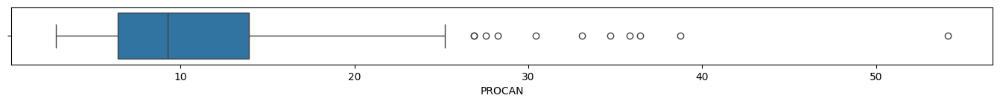

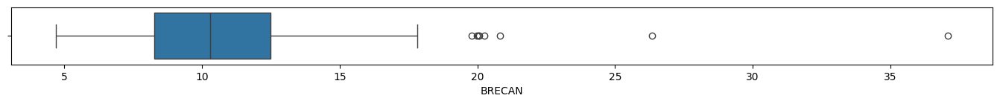

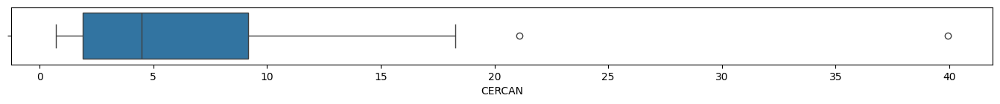

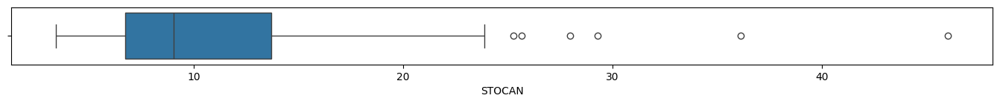

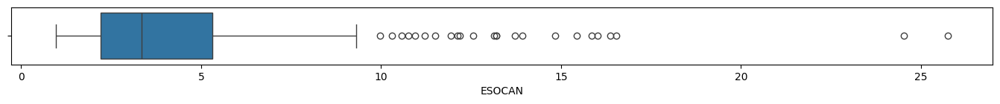

...

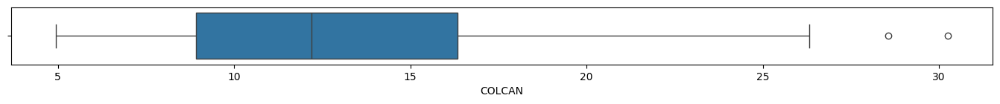

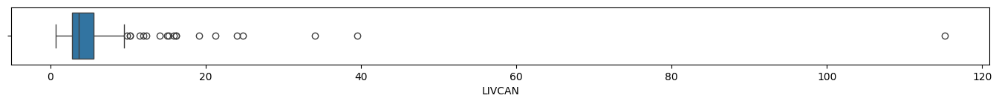

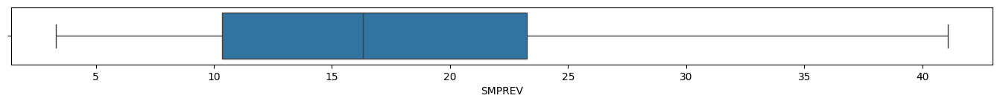

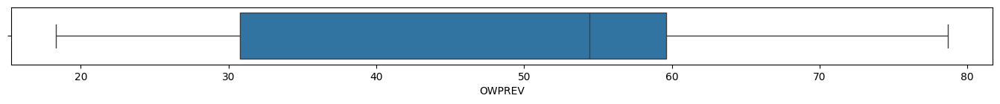

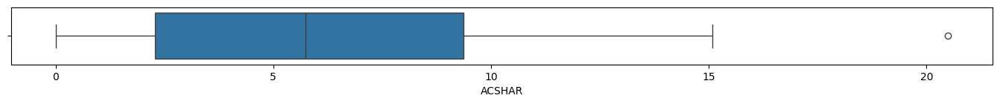

In [89]:
##################################
# Formulating the individual boxplots
# for all numeric columns
##################################
for column in df_cleaned_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=df_cleaned_numeric, x=column)

### 1.3.3 Shape Transformation 
1. A Yeo-Johnson transformation was applied to all numeric variables to improve distributional shape.
2. All variables achieved symmetrical distributions with minimal outliers after transformation.


In [91]:
# Conducting a Yeo-Johnson Transformation
# to address the distributional
# shape of the variables
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson',
                                          standardize=False)
df_cleaned_numeric_array = yeo_johnson_transformer.fit_transform(df_cleaned_numeric)

In [92]:
##################################
# Formulating a new dataset object
# for the transformed data
##################################
df_transformed_numeric = pd.DataFrame(df_cleaned_numeric_array,
                                               columns=df_cleaned_numeric.columns)

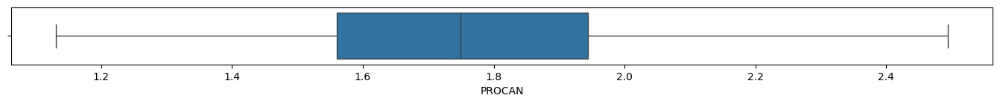

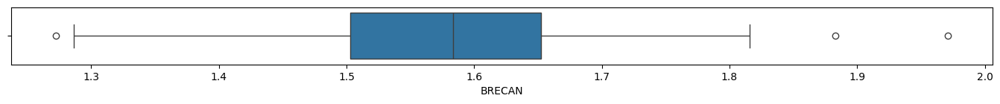

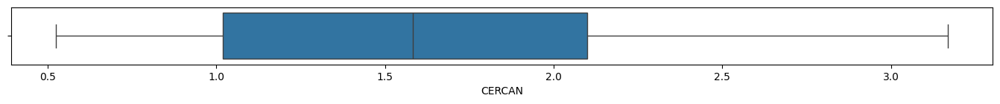

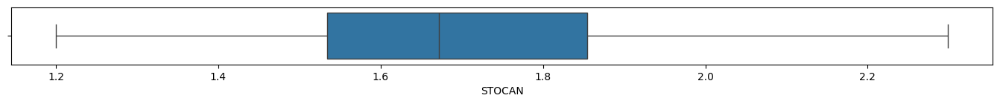

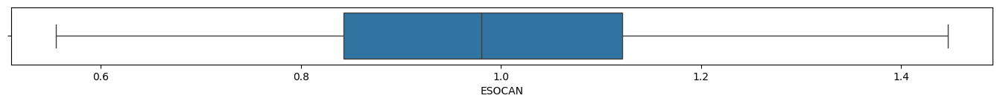

...

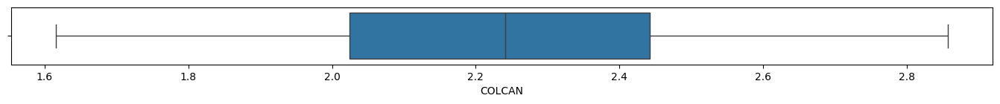

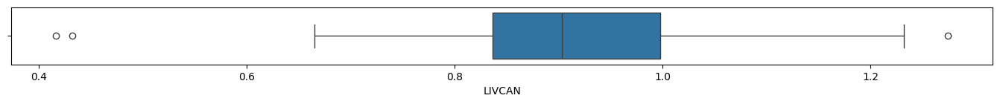

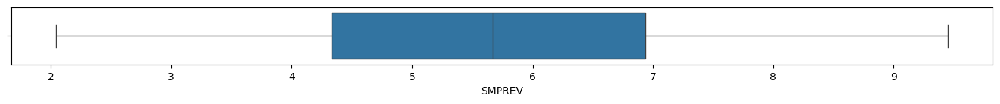

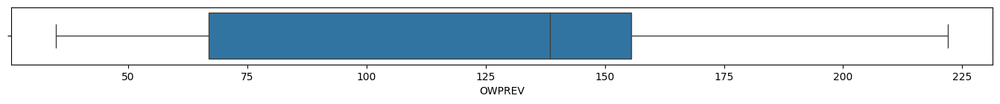

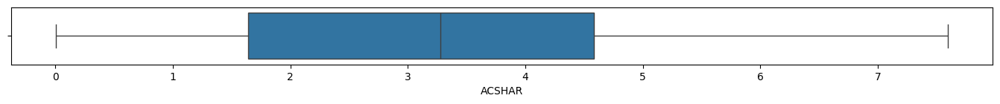

In [93]:
##################################
# Formulating the individual boxplots
# for all transformed numeric columns
##################################
for column in df_transformed_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=df_transformed_numeric, x=column)

In [94]:
##################################
# Performing a general exploration of the filtered dataset
##################################
print('Dataset Dimensions: ')
display(df_transformed_numeric.shape)

Dataset Dimensions: 


(183, 12)

In [96]:
display(df_transformed_numeric)

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,SMPREV,OWPREV,ACSHAR
0,1.5595,1.5203,1.4836,2.1487,1.1939,1.5456,2.4417,1.9846,1.1035,4.7108,46.3969,0.2004
1,1.7272,1.4076,0.9307,1.7470,0.6928,2.6330,3.0570,2.0417,1.0378,6.4628,149.2448,3.8224
2,1.4670,1.4686,1.1002,1.4007,0.6154,2.0444,2.2954,1.9526,0.7708,4.5421,163.6112,0.7992
3,1.7704,1.5352,1.0595,1.6330,1.0009,3.2883,3.2603,2.6740,1.0911,7.4729,169.3720,5.1050
4,1.9120,1.6229,2.2285,1.6682,1.2514,1.7808,2.5816,2.0787,0.8161,3.8904,58.1402,3.7374
...,...,...,...,...,...,...,...,...,...,...,...,...
178,1.9905,1.5533,1.9988,1.8183,0.8160,2.4509,2.8083,2.1890,0.7997,5.7294,168.3522,2.5885
179,1.2905,1.6500,1.6597,1.7169,0.9307,2.1167,3.0677,2.4898,0.8322,6.4983,34.8080,4.3473
180,1.5002,1.4362,1.0565,2.0113,1.0697,1.3550,2.3069,1.8210,0.8885,5.2531,120.5007,0.0504
181,1.9556,1.6259,2.3874,1.6536,1.3591,2.2641,2.3685,2.2649,0.8543,4.5909,58.9437,3.5868


### 1.3.4 Centering and Scaling 

1. All numeric variables were transformed using the standardization method to achieve a comparable scale between values.


In [97]:
##################################
# Conducting standardization
# to transform the values of the 
# variables into comparable scale
##################################
standardization_scaler = StandardScaler()
df_transformed_numeric_array = standardization_scaler.fit_transform(df_transformed_numeric)

In [98]:
##################################
# Formulating a new dataset object
# for the scaled data
##################################
df_scaled_numeric = pd.DataFrame(df_transformed_numeric_array,
                                          columns=df_transformed_numeric.columns)

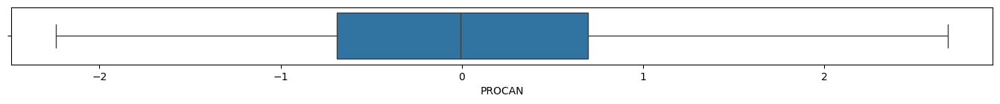

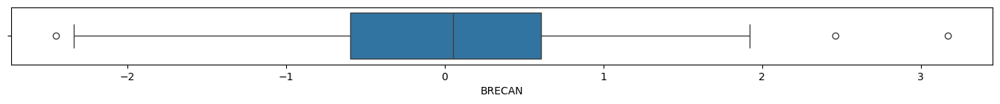

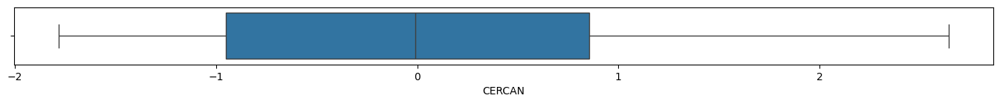

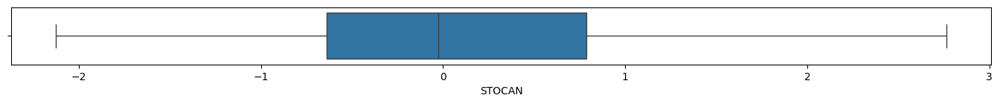

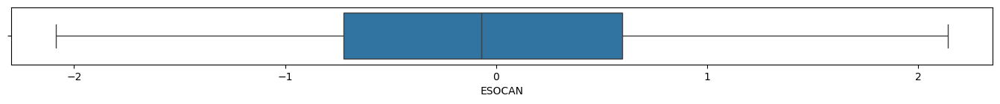

...

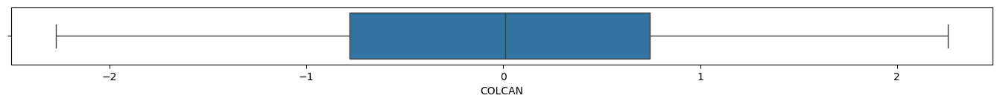

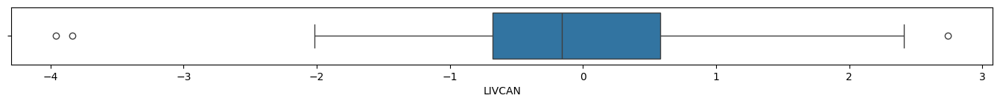

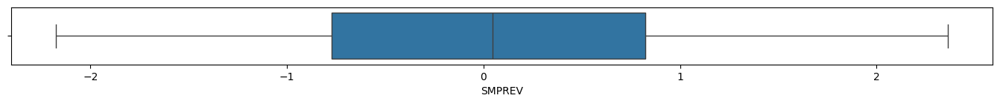

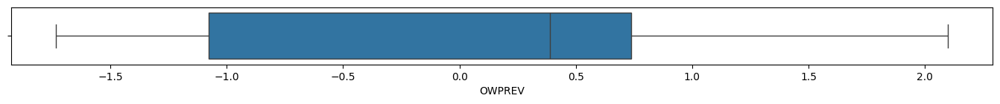

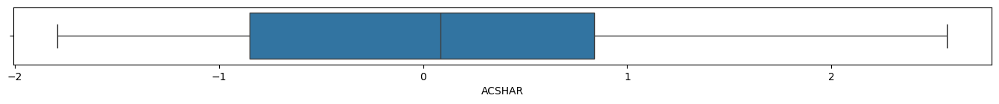

In [99]:
##################################
# Formulating the individual boxplots
# for all transformed numeric columns
##################################
for column in df_scaled_numeric:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=df_scaled_numeric, x=column)

### 1.3.5 Preprocessed Data Description <a class="anchor" id="1.4.6"></a>

1. The preprocessed dataset is comprised of:
    * **183 rows** (observations)
    * **16 columns** (variables)
        * **1/16 metadata** (object)
            * <span style="color: #FF0000">COUNTRY</span>
            * <span style="color: #FF0000">CODE</span>
        * **2/16 metadata** (numeric)
            * <span style="color: #FF0000">GEOLAT</span>
            * <span style="color: #FF0000">GEOLON</span>
        * **9/16 clustering descriptors** (numeric)
             * <span style="color: #FF0000">PROCAN</span>
             * <span style="color: #FF0000">BRECAN</span>
             * <span style="color: #FF0000">CERCAN</span>
             * <span style="color: #FF0000">STOCAN</span>
             * <span style="color: #FF0000">ESOCAN</span>
             * <span style="color: #FF0000">PANCAN</span>
             * <span style="color: #FF0000">LUNCAN</span>
             * <span style="color: #FF0000">COLCAN</span>
             * <span style="color: #FF0000">LIVCAN</span>    
        * **3/16 target descriptors** (numeric)
             * <span style="color: #FF0000">SMPREV</span>
             * <span style="color: #FF0000">OWPREV</span>
             * <span style="color: #FF0000">ACSHAR</span>
             

In [101]:
##################################
# Consolidating both numeric columns
# and geolocation data
##################################
df_preprocessed = pd.concat([df_scaled_numeric,df_cleaned_numeric_geolocation], axis=1, join='inner')  

In [102]:
##################################
# Performing a general exploration of the consolidated dataset
##################################
print('Dataset Dimensions: ')
display(df_preprocessed.shape)

Dataset Dimensions: 


(183, 14)

## 1.4. Data Exploration

### 1.4.1 Exploratory Data Analysis

1. Bivariate analysis identified individual descriptors with generally linear relationship to the target descriptor based on visual inspection.
2. Linear relationships for the following descriptors and <span style="color: #FF0000">SMPREV</span> variables were observed: 
    * <span style="color: #FF0000">LUNCAN</span>
    * <span style="color: #FF0000">COLCAN</span>    
3. Linear relationships for the following descriptors and <span style="color: #FF0000">OWPREV</span> variables were observed: 
    * <span style="color: #FF0000">PANCAN</span>
    * <span style="color: #FF0000">COLCAN</span>  
4. Linear relationships for the following descriptors and <span style="color: #FF0000">ACSHAR</span> variables were observed: 
    * <span style="color: #FF0000">COLCAN</span>
    * <span style="color: #FF0000">PANCAN</span>  
    

In [103]:
##################################
# Segregating the target
# and descriptor variable lists
##################################
df_preprocessed_target_SMPREV = ['SMPREV']
df_preprocessed_target_OWPREV = ['OWPREV']
df_preprocessed_target_ACSHAR = ['ACSHAR']
df_preprocessed_descriptors = df_preprocessed.drop(['SMPREV','OWPREV','ACSHAR','GEOLAT','GEOLON'], axis=1).columns

In [104]:
##################################
# Segregating the target using SMPREV
# and descriptor variable names
##################################
y_variable = 'SMPREV'
x_variables = df_preprocessed_descriptors

In [105]:
##################################
# Defining the number of 
# rows and columns for the subplots
##################################
num_rows = 3
num_cols = 3

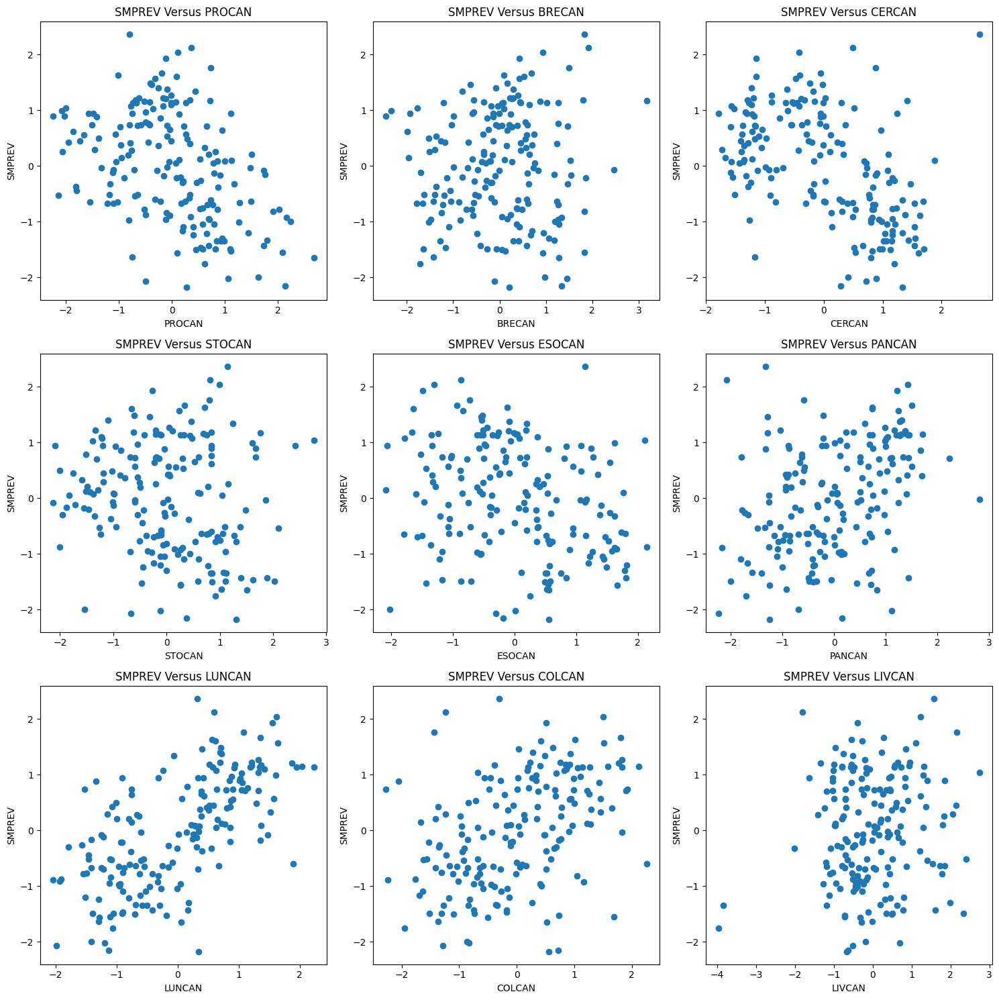

In [106]:
##################################
# Formulating the subplot structure
##################################
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

##################################
# Flattening the multi-row and
# multi-column axes
##################################
axes = axes.ravel()

##################################
# Formulating the individual scatterplots
# for all scaled numeric columns
##################################
for i, x_variable in enumerate(x_variables):
    ax = axes[i]
    ax.scatter(df_preprocessed[x_variable],df_preprocessed[y_variable])
    ax.set_title(f'{y_variable} Versus {x_variable}')
    ax.set_xlabel(x_variable)
    ax.set_ylabel(y_variable)

##################################
# Adjusting the subplot layout
##################################
plt.tight_layout()

##################################
# Presenting the subplots
##################################
plt.show()

In [107]:
##################################
# Segregating the target using OWPREV
# and descriptor variable names
##################################
y_variable = 'OWPREV'
x_variables = df_preprocessed_descriptors

In [108]:
##################################
# Defining the number of 
# rows and columns for the subplots
##################################
num_rows = 3
num_cols = 3

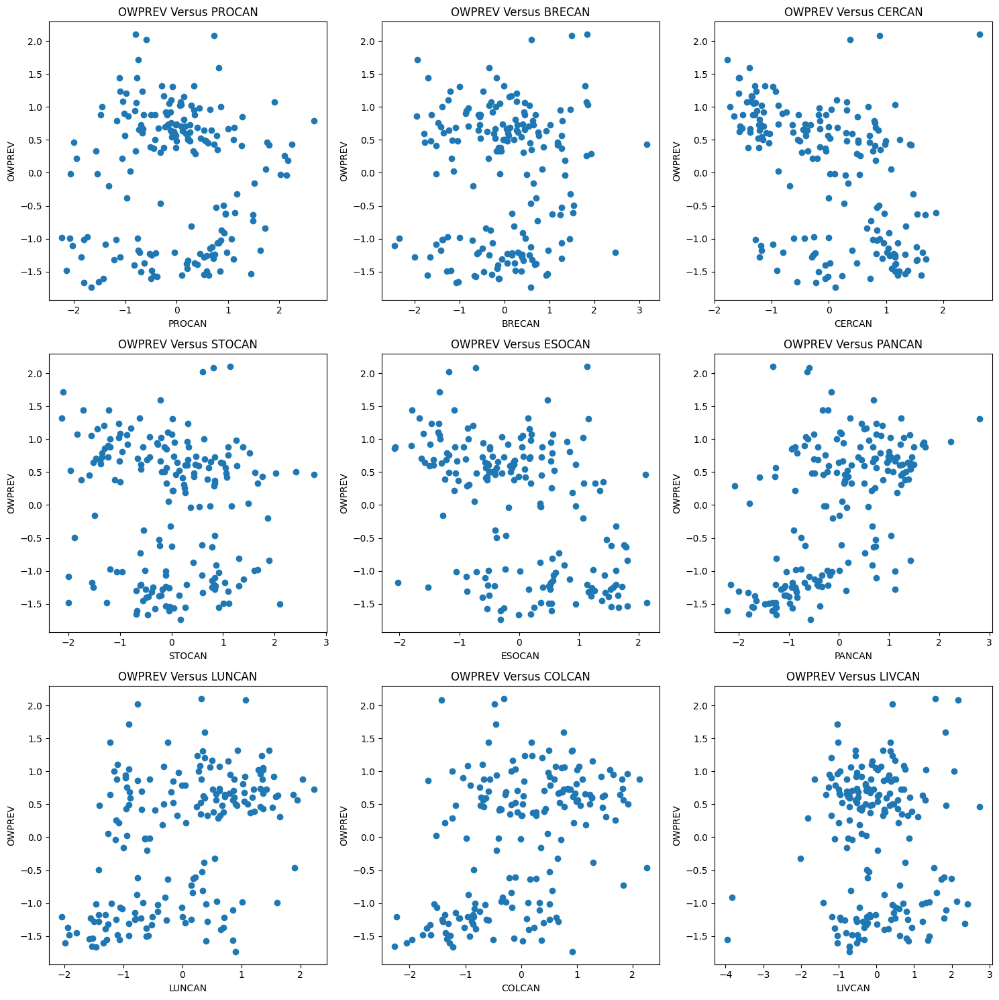

In [109]:
##################################
# Formulating the subplot structure
##################################
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

##################################
# Flattening the multi-row and
# multi-column axes
##################################
axes = axes.ravel()

##################################
# Formulating the individual scatterplots
# for all scaled numeric columns
##################################
for i, x_variable in enumerate(x_variables):
    ax = axes[i]
    ax.scatter(df_preprocessed[x_variable],df_preprocessed[y_variable])
    ax.set_title(f'{y_variable} Versus {x_variable}')
    ax.set_xlabel(x_variable)
    ax.set_ylabel(y_variable)

##################################
# Adjusting the subplot layout
##################################
plt.tight_layout()

##################################
# Presenting the subplots
##################################
plt.show()

In [110]:
##################################
# Segregating the target using ACSHAR
# and descriptor variable names
##################################
y_variable = 'ACSHAR'
x_variables = df_preprocessed_descriptors

In [111]:
##################################
# Defining the number of 
# rows and columns for the subplots
##################################
num_rows = 3
num_cols = 3

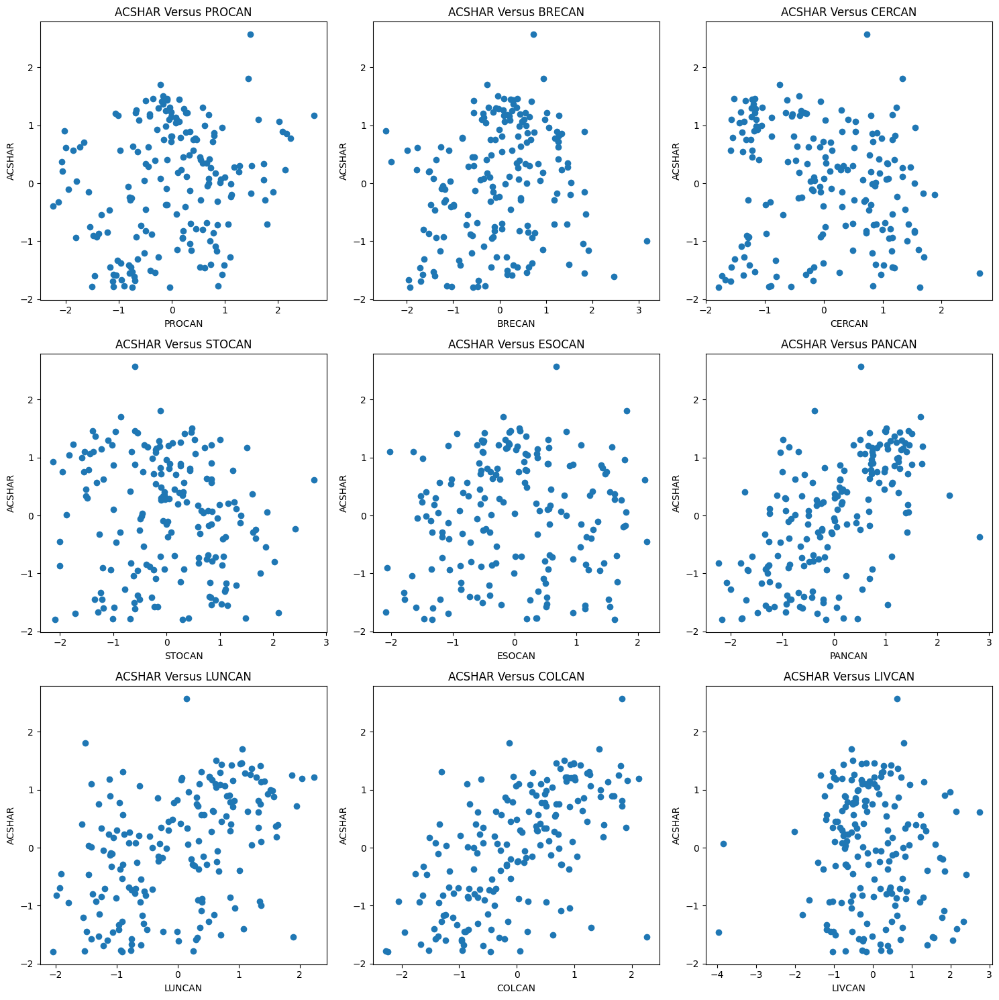

In [112]:
##################################
# Formulating the subplot structure
##################################
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

##################################
# Flattening the multi-row and
# multi-column axes
##################################
axes = axes.ravel()

##################################
# Formulating the individual scatterplots
# for all scaled numeric columns
##################################
for i, x_variable in enumerate(x_variables):
    ax = axes[i]
    ax.scatter(df_preprocessed[x_variable],df_preprocessed[y_variable])
    ax.set_title(f'{y_variable} Versus {x_variable}')
    ax.set_xlabel(x_variable)
    ax.set_ylabel(y_variable)

##################################
# Adjusting the subplot layout
##################################
plt.tight_layout()

##################################
# Presenting the subplots
##################################
plt.show()

## 1.5. Model Development

### 1.5.1 Premodelling Data Description

1. Among the 9 numeric descriptors, <span style="color: #FF0000">LIVCAN</span> and <span style="color: #FF0000">STOCAN</span> have not demonstrated a statistically significant linear relationship between the <span style="color: #FF0000">SMPREV</span>, <span style="color: #FF0000">OWPREV</span> nad , <span style="color: #FF0000">ACSHAR</span> target descriptors.
2. All 9 numeric descriptors were however retained for the clustering analysis.


In [113]:
##################################
# Consolidating relevant numeric columns
# after hypothesis testing
##################################
df_premodelling = df_preprocessed.drop(['GEOLAT','GEOLON'], axis=1)

In [114]:
##################################
# Performing a general exploration of the premodelling dataset
##################################
print('Dataset Dimensions: ')
display(df_premodelling.shape)

Dataset Dimensions: 


(183, 12)

In [115]:
##################################
# Listing the column names and data types
##################################
print('Column Names and Data Types:')
display(df_premodelling.dtypes)

Column Names and Data Types:


PROCAN    float64
BRECAN    float64
CERCAN    float64
STOCAN    float64
ESOCAN    float64
PANCAN    float64
LUNCAN    float64
COLCAN    float64
LIVCAN    float64
SMPREV    float64
OWPREV    float64
ACSHAR    float64
dtype: object

In [116]:
##################################
# Taking a snapshot of the dataset
##################################
df_premodelling.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,SMPREV,OWPREV,ACSHAR
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059,-0.5405,-1.4979,-1.6782
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924,0.5329,0.6090,0.4008
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914,-0.6438,0.9033,-1.3345
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091,1.1517,1.0213,1.1371
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379,-1.0431,-1.2574,0.3520


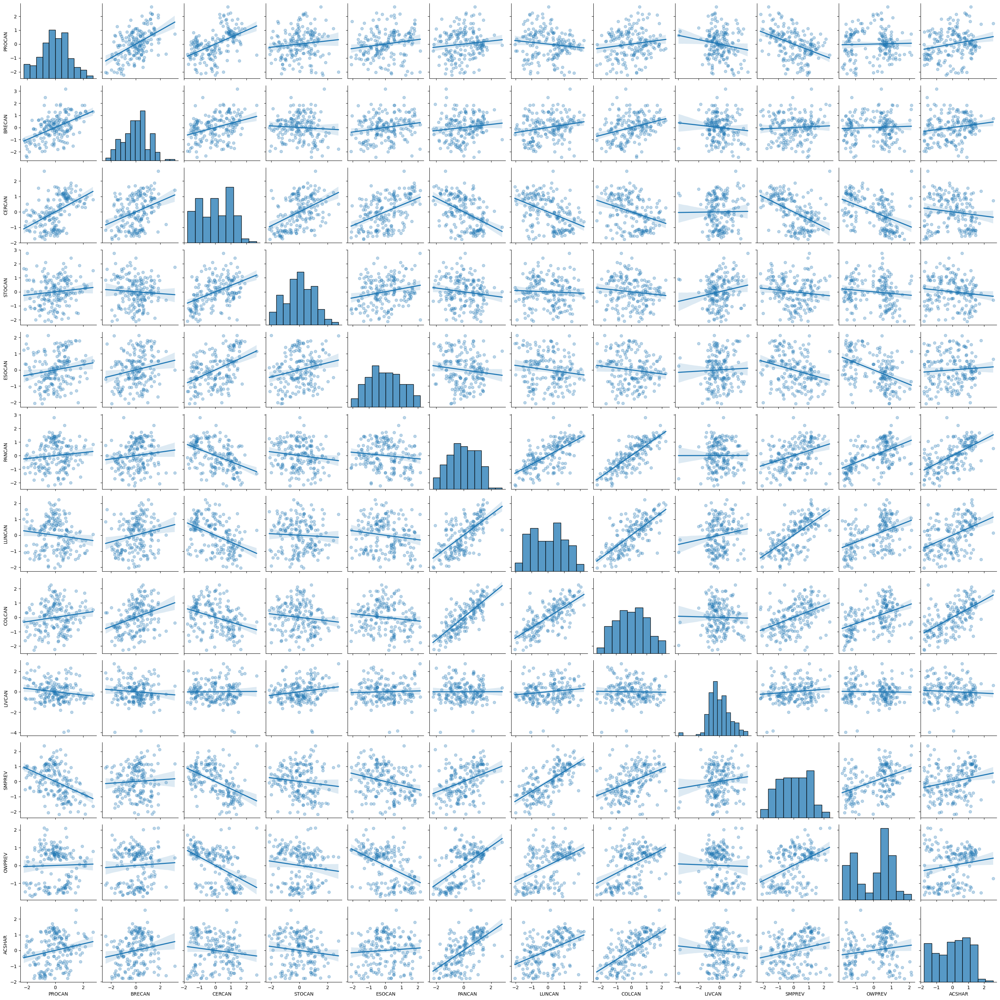

In [117]:
##################################
# Gathering the pairplot for all variables
##################################
sns.pairplot(df_premodelling, 
             kind='reg',
             plot_kws={'scatter_kws': {'alpha': 0.3}},)
plt.show()

In [118]:
##################################
# Preparing the clustering dataset
##################################
df_premodelling_clustering = df_premodelling.drop(['SMPREV','OWPREV','ACSHAR'], axis=1)
df_premodelling_clustering.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379


### 1.5.2 K-Means Clustering

[K-Means Clustering](https://onlinelibrary.wiley.com/doi/book/10.1002/9780470316801) groups similar data points together into clusters by minimizing the mean distance between geometric points. The algorithm iteratively partitions data sets into a fixed number of non-overlapping k subgroups or clusters wherein each data point belongs to the cluster with the nearest mean cluster center. The process begins by initializing all the coordinates into a pre-defined k number of cluster centers. With every pass of the algorithm, each point is assigned to its nearest cluster center. The cluster centers are then updated to be the centers of all the points assigned to it in that pass. This is performed by re-calculating the cluster centers as the average of the points in each respective cluster. The algorithm repeats until there’s a minimum change of the cluster centers from the last iteration.

[Silhouette Score](https://www.packtpub.com/product/training-systems-using-python-statistical-modeling/9781838823733) assesses the quality of clusters created by a clustering algorithm. It measures how well-separated the clusters are and how similar each data point in a cluster is to the other points in the same cluster compared to the nearest neighboring cluster. The silhouette score ranges from -1 to 1, where a higher value indicates better-defined clusters. The silhouette method requires the computation of the silhouette scores for each data point which is the average dissimilarity of the data point with all other data points in the next-nearest cluster minus the average dissimilarity of the data point to points in the same cluster and divided by the larger of the two numbers. The overall silhouette score for the clustering is the average of the silhouette scores for all data points.

1. The [k-means clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) from the <mark style="background-color: #CCECFF"><b>sklearn.cluster</b></mark> Python library API was implemented. 
2. The model contains 3 hyperparameters:
    * <span style="color: #FF0000">n_clusters</span> = number of clusters to form as well as the number of centroids to generate made to vary between 2 to 9
    * <span style="color: #FF0000">n_init</span> = number of times the k-means algorithm is run with different centroid seeds held constant at a value of auto
    * <span style="color: #FF0000">init</span> = method for initialization held constant at a value equal to k-means++
3. Hyperparameter tuning was conducted on the data with optimal model performance using the silhouette score determined for: 
    * <span style="color: #FF0000">n_clusters</span> = 2
    * <span style="color: #FF0000">n_init</span> = auto
    * <span style="color: #FF0000">init</span> = k-means++
5. The apparent model performance of the optimal model is summarized as follows:
    * **Silhouette Score** = 0.2355


In [119]:
##################################
# Fitting the K-Means Clustering algorithm
# using a range of K values
##################################
kmeans_cluster_list = list()
kmeans_cluster_inertia = list()
kmeans_cluster_silhouette_score = list()
for cluster_count in range(2,10):
    km = KMeans(n_clusters=cluster_count, 
                random_state=88888888,
                n_init='auto',
                init='k-means++')
    km = km.fit(df_premodelling_clustering)
    kmeans_cluster_list.append(cluster_count)
    kmeans_cluster_inertia.append(km.inertia_)
    kmeans_cluster_silhouette_score.append(silhouette_score(df_premodelling_clustering, 
                                                            km.predict(df_premodelling_clustering), 
                                                            metric='euclidean'))

In [120]:
##################################
# Consolidating the model performance metrics
# for the K-Means Clustering algorithm
# using a range of K values
##################################
kmeans_clustering_evaluation_summary = pd.DataFrame(zip(kmeans_cluster_list,
                                                        kmeans_cluster_inertia,
                                                        kmeans_cluster_silhouette_score), 
                                                    columns=['KMeans.Cluster.Count',
                                                             'KMeans.Cluster.Inertia',
                                                             'KMeans.Cluster.Silhouette.Score'])
kmeans_clustering_evaluation_summary

,KMeans.Cluster.Count,KMeans.Cluster.Inertia,KMeans.Cluster.Silhouette.Score
0,2,1238.5327,0.2350
1,3,1027.1577,0.2364
2,4,1025.1634,0.1395
3,5,871.6545,0.2034
4,6,795.0377,0.2186
5,7,775.7324,0.1693
6,8,704.8949,0.1804
7,9,710.5409,0.1596


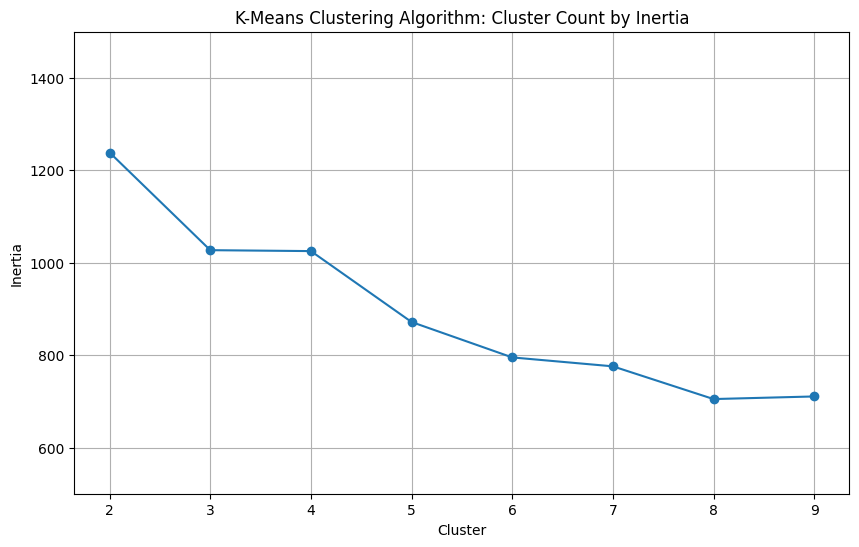

In [121]:
###################################
# Plotting the Inertia performance
# by cluster count using a range of K values
# for the K-Means Clustering algorithm
##################################
kmeans_cluster_count_values = np.array(kmeans_clustering_evaluation_summary['KMeans.Cluster.Count'].values)
kmeans_inertia_values = np.array(kmeans_clustering_evaluation_summary['KMeans.Cluster.Inertia'].values)
plt.figure(figsize=(10, 6))
plt.plot(kmeans_cluster_count_values, kmeans_inertia_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(500,1500)
plt.title("K-Means Clustering Algorithm: Cluster Count by Inertia")
plt.xlabel("Cluster")
plt.ylabel("Inertia")
plt.show()

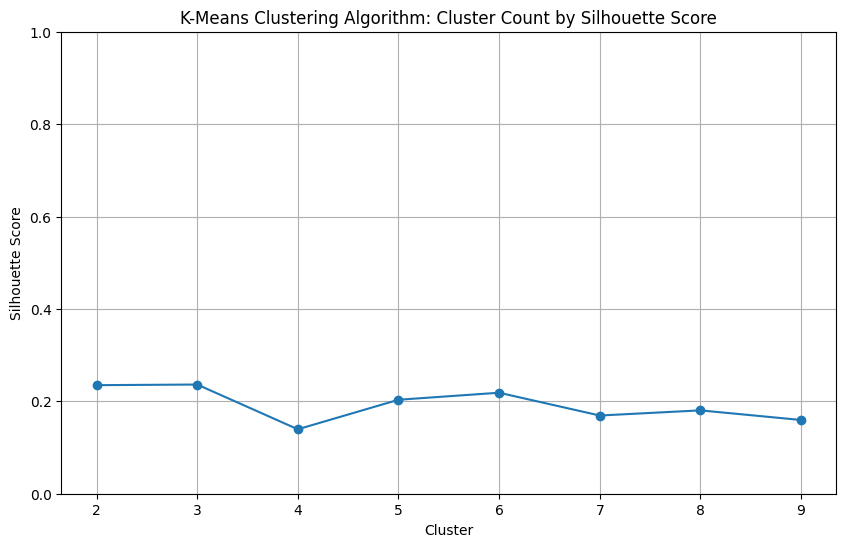

In [122]:
###################################
# Plotting the Silhouette Score performance
# by cluster count using a range of K values
# for the K-Means Clustering algorithm
##################################
kmeans_cluster_count_values = np.array(kmeans_clustering_evaluation_summary['KMeans.Cluster.Count'].values)
kmeans_silhouette_score_values = np.array(kmeans_clustering_evaluation_summary['KMeans.Cluster.Silhouette.Score'].values)
plt.figure(figsize=(10, 6))
plt.plot(kmeans_cluster_count_values, kmeans_silhouette_score_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(0,1)
plt.title("K-Means Clustering Algorithm: Cluster Count by Silhouette Score")
plt.xlabel("Cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [124]:
###################################
# Formulating the final K-Means Clustering model
# using the optimal cluster count
##################################
kmeans_clustering = KMeans(n_clusters=2, 
                           random_state=88888888,
                           n_init='auto',
                           init='k-means++')
kmeans_clustering = kmeans_clustering.fit(df_premodelling_clustering)

###################################
# Gathering the Inertia and Silhouette Score
# for the final K-Means Clustering model
##################################
kmeans_clustering_inertia = kmeans_clustering.inertia_
kmeans_clustering_silhouette_score = silhouette_score(df_premodelling_clustering, 
                                                      kmeans_clustering.predict(df_premodelling_clustering), 
                                                      metric='euclidean')

In [126]:
##################################
# Plotting the cluster labels
# for the final K-Means Clustering model
##################################
df_kmeans_clustering = df_premodelling_clustering.copy()
df_kmeans_clustering['KMEANS_CLUSTER'] = kmeans_clustering.predict(df_kmeans_clustering)
df_kmeans_clustering.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,KMEANS_CLUSTER
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059,1
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924,0
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914,0
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091,0
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379,1


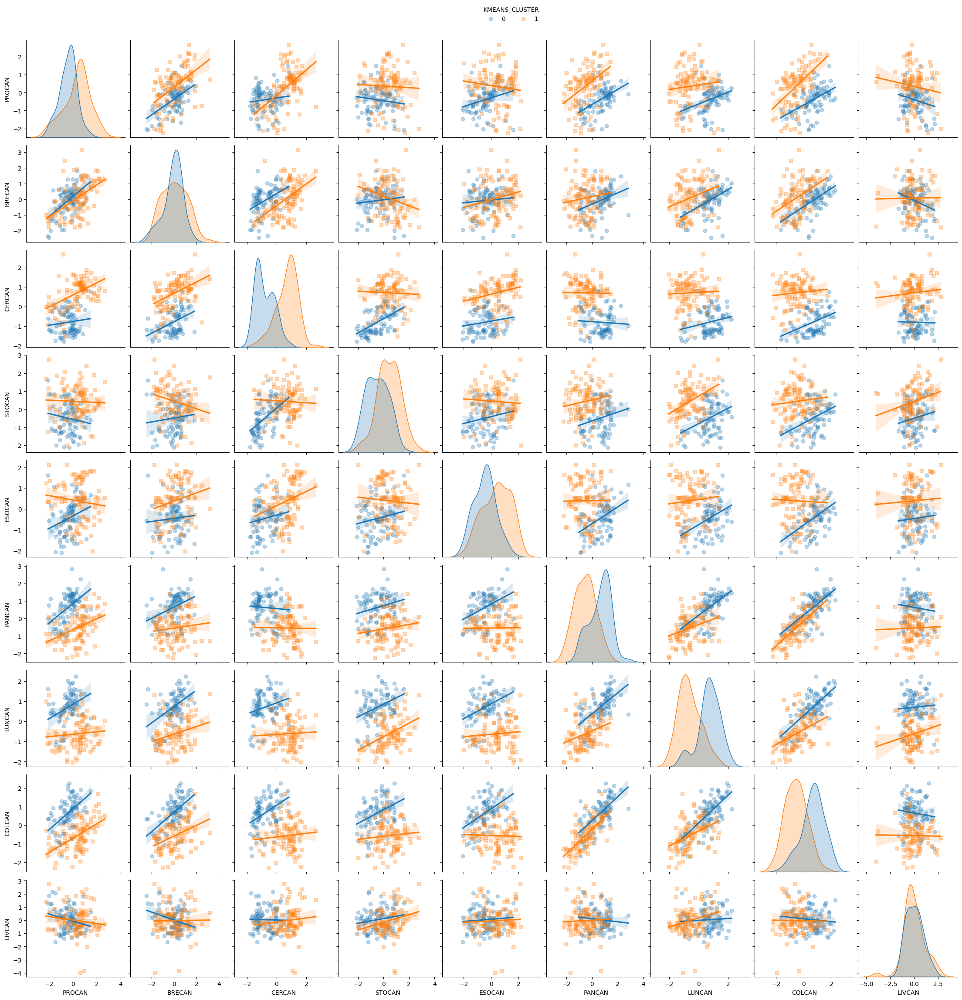

In [127]:
##################################
# Gathering the pairplot for all variables
# labelled using the final K-Means Clustering model
##################################
df_kmeans_clustering_plot = sns.pairplot(df_kmeans_clustering,
                                                        kind='reg',
                                                        markers=["o", "s"],
                                                        plot_kws={'scatter_kws': {'alpha': 0.3}},
                                                        hue='KMEANS_CLUSTER');
sns.move_legend(df_kmeans_clustering_plot, 
                "lower center",
                bbox_to_anchor=(.5, 1), ncol=2, title='KMEANS_CLUSTER', frameon=False)
plt.show()

### 1.5.3 Bisecting K-Means Clustering
[Bisecting K-Means Clustering](https://www.semanticscholar.org/paper/A-Comparison-of-Document-Clustering-Techniques-Steinbach-Karypis/9378a3797d5f815babe7b392a199ea9d8d4f1dcf) is a variant of the traditional K-Means algorithm which iteratively splits clusters into two parts until the desired number of clusters is reached. It is a hierarchical clustering approach that uses a divisive strategy to build a hierarchy of clusters. The algorithm starts with the entire dataset as the initial cluster. The standard K-Means algorithm is implemented to the selected cluster, splitting it into two sub-clusters. Both steps are repeated until the desired number of clusters is reached. In cases when there are multiple clusters present, the algorithm selects the cluster with the largest variance. This results in a hierarchical structure of clusters, and the process can be stopped at any desired level of granularity.

[Silhouette Score](https://www.packtpub.com/product/training-systems-using-python-statistical-modeling/9781838823733) assesses the quality of clusters created by a clustering algorithm. It measures how well-separated the clusters are and how similar each data point in a cluster is to the other points in the same cluster compared to the nearest neighboring cluster. The silhouette score ranges from -1 to 1, where a higher value indicates better-defined clusters. The silhouette method requires the computation of the silhouette scores for each data point which is the average dissimilarity of the data point with all other data points in the next-nearest cluster minus the average dissimilarity of the data point to points in the same cluster and divided by the larger of the two numbers. The overall silhouette score for the clustering is the average of the silhouette scores for all data points.

1. The [bisecting k-means clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.BisectingKMeans.html#sklearn.cluster.BisectingKMeans) from the <mark style="background-color: #CCECFF"><b>sklearn.cluster</b></mark> Python library API was implemented. 
2. The model contains 3 hyperparameters:
    * <span style="color: #FF0000">n_clusters</span> = number of clusters to form as well as the number of centroids to generate made to vary between 2 to 9
    * <span style="color: #FF0000">n_init</span> = number of time the inner k-means algorithm will be run with different centroid seeds in each bisection held constant at a value of 1
    * <span style="color: #FF0000">init</span> = method for initialization held constant at a value equal to k-means++
3. Hyperparameter tuning was conducted on the data with optimal model performance using the silhouette score determined for: 
    * <span style="color: #FF0000">n_clusters</span> = 2
    * <span style="color: #FF0000">n_init</span> = 1
    * <span style="color: #FF0000">init</span> = k-means++
5. The apparent model performance of the optimal model is summarized as follows:
    * **Silhouette Score** = 0.2355
    

In [129]:
##################################
# Fitting the Bisecting K-Means Clustering algorithm
# using a range of K values
##################################
bisecting_kmeans_cluster_list = list()
bisecting_kmeans_cluster_inertia = list()
bisecting_kmeans_cluster_silhouette_score = list()
for cluster_count in range(2,10):
    bk = BisectingKMeans(n_clusters=cluster_count, 
                         random_state=88888888,
                         n_init=1,
                         init='k-means++')
    bk = bk.fit(df_premodelling_clustering)
    bisecting_kmeans_cluster_list.append(cluster_count)
    bisecting_kmeans_cluster_inertia.append(bk.inertia_)
    bisecting_kmeans_cluster_silhouette_score.append(silhouette_score(df_premodelling_clustering, 
                                                                      bk.predict(df_premodelling_clustering), 
                                                                      metric='euclidean'))

In [130]:
##################################
# Consolidating the model performance metrics
# for the Bisecting K-Means Clustering algorithm
# using a range of K values
##################################
bisecting_kmeans_clustering_evaluation_summary = pd.DataFrame(zip(bisecting_kmeans_cluster_list,
                                                                  bisecting_kmeans_cluster_inertia,
                                                                  bisecting_kmeans_cluster_silhouette_score),
                                                              columns=['Bisecting.KMeans.Cluster.Count',
                                                                       'Bisecting.KMeans.Cluster.Inertia',
                                                                       'Bisecting.KMeans.Cluster.Silhouette.Score'])
bisecting_kmeans_clustering_evaluation_summary

,Bisecting.KMeans.Cluster.Count,Bisecting.KMeans.Cluster.Inertia,Bisecting.KMeans.Cluster.Silhouette.Score
0,2,1238.5327,0.2350
1,3,1079.9345,0.2088
2,4,956.9095,0.1859
3,5,902.7490,0.1832
4,6,853.3242,0.1847
5,7,805.8361,0.1454
6,8,788.8381,0.1415
7,9,740.0624,0.1428


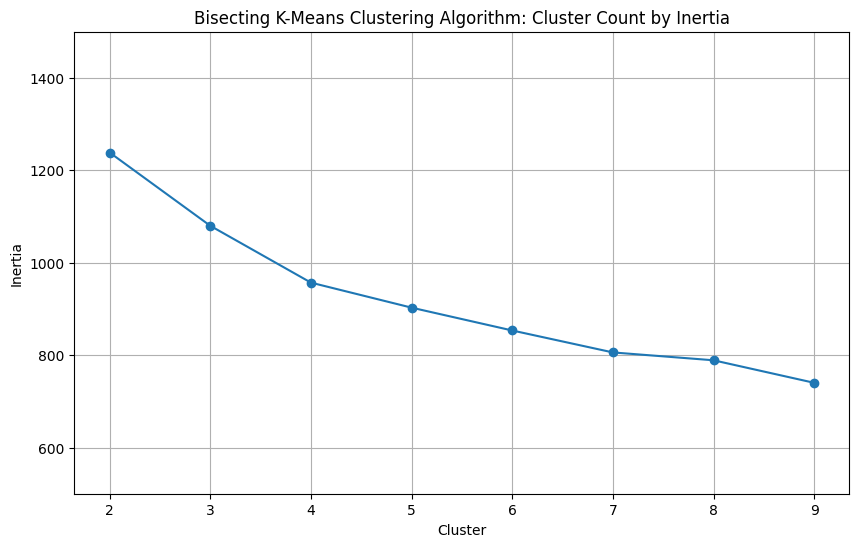

In [131]:
###################################
# Plotting the Inertia performance
# by cluster count using a range of K values
# for the Bisecting K-Means Clustering algorithm
##################################
bisecting_kmeans_cluster_count_values = np.array(bisecting_kmeans_clustering_evaluation_summary['Bisecting.KMeans.Cluster.Count'].values)
bisecting_kmeans_inertia_values = np.array(bisecting_kmeans_clustering_evaluation_summary['Bisecting.KMeans.Cluster.Inertia'].values)
plt.figure(figsize=(10, 6))
plt.plot(bisecting_kmeans_cluster_count_values, bisecting_kmeans_inertia_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(500,1500)
plt.title("Bisecting K-Means Clustering Algorithm: Cluster Count by Inertia")
plt.xlabel("Cluster")
plt.ylabel("Inertia")
plt.show()

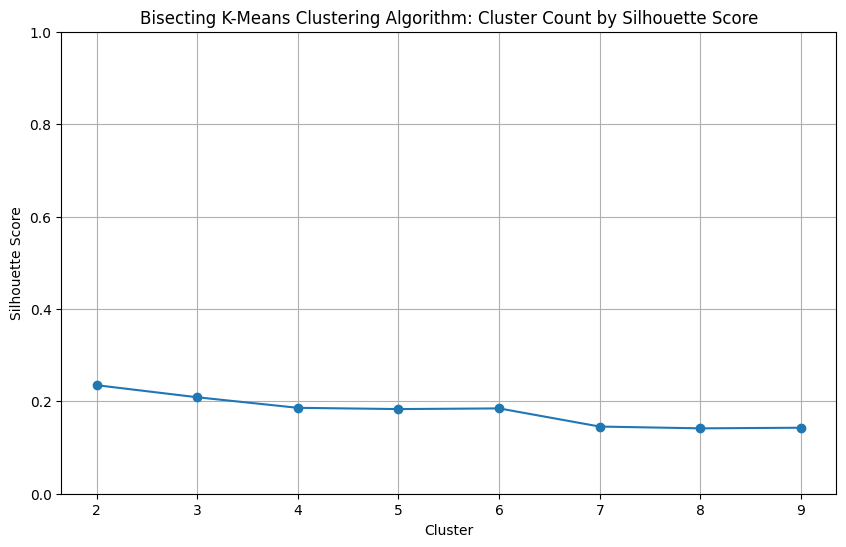

In [132]:
###################################
# Plotting the Silhouette Score performance
# by cluster count using a range of K values
# for the Bisecting K-Means Clustering algorithm
##################################
bisecting_kmeans_cluster_count_values = np.array(bisecting_kmeans_clustering_evaluation_summary['Bisecting.KMeans.Cluster.Count'].values)
bisecting_kmeans_silhouette_score_values = np.array(bisecting_kmeans_clustering_evaluation_summary['Bisecting.KMeans.Cluster.Silhouette.Score'].values)
plt.figure(figsize=(10, 6))
plt.plot(bisecting_kmeans_cluster_count_values, bisecting_kmeans_silhouette_score_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(0,1)
plt.title("Bisecting K-Means Clustering Algorithm: Cluster Count by Silhouette Score")
plt.xlabel("Cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [133]:
###################################
# Formulating the final Bisecting K-Means Clustering model
# using the optimal cluster count
##################################
bisecting_kmeans_clustering = BisectingKMeans(n_clusters=2, 
                                              random_state=88888888,
                                              n_init=1,
                                              init='k-means++')
bisecting_kmeans_clustering = bisecting_kmeans_clustering.fit(df_premodelling_clustering)

###################################
# Gathering the Inertia and Silhouette Score
# for the final Bisecting K-Means Clustering model
##################################
bisecting_kmeans_clustering_inertia = bisecting_kmeans_clustering.inertia_
bisecting_kmeans_clustering_silhouette_score = silhouette_score(df_premodelling_clustering, 
                                                                bisecting_kmeans_clustering.predict(df_premodelling_clustering), 
                                                                metric='euclidean')

In [134]:
##################################
# Plotting the cluster labels
# for the final Bisecting K-Means Clustering model
##################################
df_bisecting_kmeans_clustering = df_premodelling_clustering.copy()
df_bisecting_kmeans_clustering['BISECTING_KMEANS_CLUSTER'] = bisecting_kmeans_clustering.predict(df_bisecting_kmeans_clustering)
df_bisecting_kmeans_clustering.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,BISECTING_KMEANS_CLUSTER
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059,1
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924,0
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914,0
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091,0
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379,1


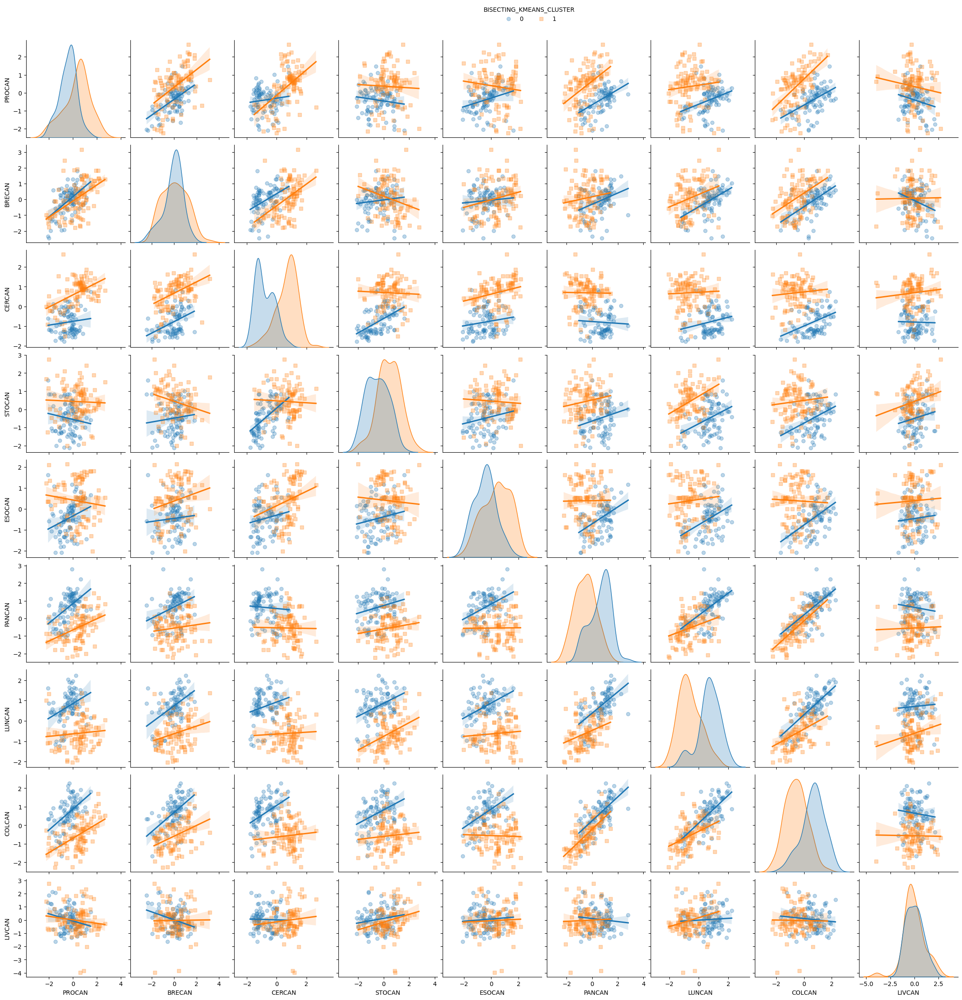

In [135]:
##################################
# Gathering the pairplot for all variables
# labelled using the final Bisecting K-Means Clustering model
##################################
df_bisecting_kmeans_clustering_plot = sns.pairplot(df_bisecting_kmeans_clustering,
                                                                  kind='reg',
                                                                  markers=["o", "s"],
                                                                  plot_kws={'scatter_kws': {'alpha': 0.3}},
                                                                  hue='BISECTING_KMEANS_CLUSTER');
sns.move_legend(df_bisecting_kmeans_clustering_plot, 
                "lower center",
                bbox_to_anchor=(.5, 1), ncol=2, title='BISECTING_KMEANS_CLUSTER', frameon=False)
plt.show()

### 1.5.4 Gaussian Mixture Clustering 

[Gaussian Mixture Clustering](https://www.semanticscholar.org/paper/A-Comparison-of-Document-Clustering-Techniques-Steinbach-Karypis/9378a3797d5f815babe7b392a199ea9d8d4f1dcf) is a probabilistic model that assumes all the data points are generated from a mixture of a finite number of Gaussian distributions with unknown parameters incorporating information about the covariance structure of the data as well as the centers of the latent Gaussians. The algorithm involves initializing the parameters of the Gaussian components using K-means clustering to get initial estimates for the means and the identity matrix as a starting point for the covariance matrices. The expectation-maximization process is applied by calculating the probability of each data point belonging to each Gaussian component using the Bayes' theorem for the expectation step, and updating the parameters of the Gaussian components based on the weighted sum of the data points based on the probabilities determined for the maximization step. Convergence is checked by evaluating whether the log-likelihood of the data has stabilized or reached a maximum. Both steps are iterated until the criteria is met. After convergence, each data point is assigned to the cluster with the highest probability.

[Silhouette Score](https://www.packtpub.com/product/training-systems-using-python-statistical-modeling/9781838823733) assesses the quality of clusters created by a clustering algorithm. It measures how well-separated the clusters are and how similar each data point in a cluster is to the other points in the same cluster compared to the nearest neighboring cluster. The silhouette score ranges from -1 to 1, where a higher value indicates better-defined clusters. The silhouette method requires the computation of the silhouette scores for each data point which is the average dissimilarity of the data point with all other data points in the next-nearest cluster minus the average dissimilarity of the data point to points in the same cluster and divided by the larger of the two numbers. The overall silhouette score for the clustering is the average of the silhouette scores for all data points.

1. The [gaussian mixture clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html#sklearn.mixture.GaussianMixture) from the <mark style="background-color: #CCECFF"><b>sklearn.mixture</b></mark> Python library API was implemented. 
2. The model contains 4 hyperparameters:
    * <span style="color: #FF0000">n_components</span> = number of mixture components made to vary between 2 to 9
    * <span style="color: #FF0000">covariance_type</span> = type of covariance parameters to use held constant at a value equal to full (each component has its own general covariance matrix)
    * <span style="color: #FF0000">init_params</span> = method for initialization held constant at a value equal to k-means++
    * <span style="color: #FF0000">tol</span> = convergence threshold held constant at a value of 1e-3
3. Hyperparameter tuning was conducted on the data with optimal model performance using the silhouette score determined for: 
    * <span style="color: #FF0000">n_components</span> = 2
    * <span style="color: #FF0000">covariance_type</span> = full
    * <span style="color: #FF0000">init_params</span> = k-means++
    * <span style="color: #FF0000">tol</span> = 1e-3
4. The apparent model performance of the optimal model is summarized as follows:
    * **Silhouette Score** = 0.2239
    

In [136]:
##################################
# Fitting the GMM Clustering algorithm
# using a range of K values
##################################
gaussian_mixture_cluster_list = list()
gaussian_mixture_cluster_silhouette_score = list()
for cluster_count in range(2,10):
    gm = GaussianMixture(n_components=cluster_count,
                         init_params='k-means++',
                         covariance_type='full',
                         tol = 1e-3,
                         random_state=88888888)
    gm = gm.fit(df_premodelling_clustering)
    gaussian_mixture_cluster_list.append(cluster_count)
    gaussian_mixture_cluster_silhouette_score.append(silhouette_score(df_premodelling_clustering, 
                                                                      gm.predict(df_premodelling_clustering), 
                                                                      metric='euclidean'))

In [137]:
##################################
# Consolidating the model performance metrics
# for the GMM Clustering algorithm
# using a range of K values
##################################
gaussian_mixture_clustering_evaluation_summary = pd.DataFrame(zip(gaussian_mixture_cluster_list,
                                                                  gaussian_mixture_cluster_silhouette_score), 
                                                              columns=['GMM.Cluster.Count',
                                                                       'GMM.Cluster.Silhouette.Score'])
gaussian_mixture_clustering_evaluation_summary

,GMM.Cluster.Count,GMM.Cluster.Silhouette.Score
0,2,0.1422
1,3,0.1959
2,4,0.1061
3,5,0.1168
4,6,0.1336
5,7,0.1308
6,8,0.1266
7,9,0.1338


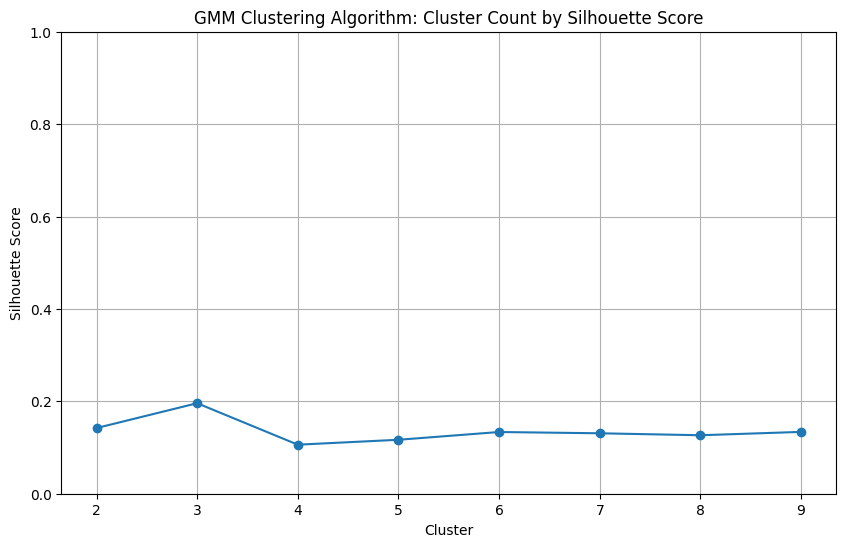

In [138]:
###################################
# Plotting the Silhouette Score performance
# by cluster count using a range of K values
# for the GMM Clustering algorithm
##################################
gaussian_mixture_cluster_count_values = np.array(gaussian_mixture_clustering_evaluation_summary['GMM.Cluster.Count'].values)
gaussian_mixture_silhouette_score_values = np.array(gaussian_mixture_clustering_evaluation_summary['GMM.Cluster.Silhouette.Score'].values)
plt.figure(figsize=(10, 6))
plt.plot(gaussian_mixture_cluster_count_values, gaussian_mixture_silhouette_score_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(0,1)
plt.title("GMM Clustering Algorithm: Cluster Count by Silhouette Score")
plt.xlabel("Cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [139]:
###################################
# Formulating the final GMM Clustering model
# using the optimal cluster count
##################################
gaussian_mixture_clustering = GaussianMixture(n_components=2,
                                              init_params='k-means++',
                                              random_state=88888888)
gaussian_mixture_clustering = gaussian_mixture_clustering.fit(df_premodelling_clustering)

###################################
# Gathering the Silhouette Score
# for the final GMM Clustering model
##################################
gaussian_mixture_clustering_silhouette_score = silhouette_score(df_premodelling_clustering, 
                                                                      gaussian_mixture_clustering.predict(df_premodelling_clustering), 
                                                                      metric='euclidean')

In [141]:
##################################
# Plotting the cluster labels
# for the final GMM Clustering model
##################################
df_gaussian_mixture_clustering = df_premodelling_clustering.copy()
df_gaussian_mixture_clustering['GMM_CLUSTER'] = gaussian_mixture_clustering.predict(df_gaussian_mixture_clustering)
df_gaussian_mixture_clustering.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,GMM_CLUSTER
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059,1
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924,1
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914,1
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091,0
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379,0


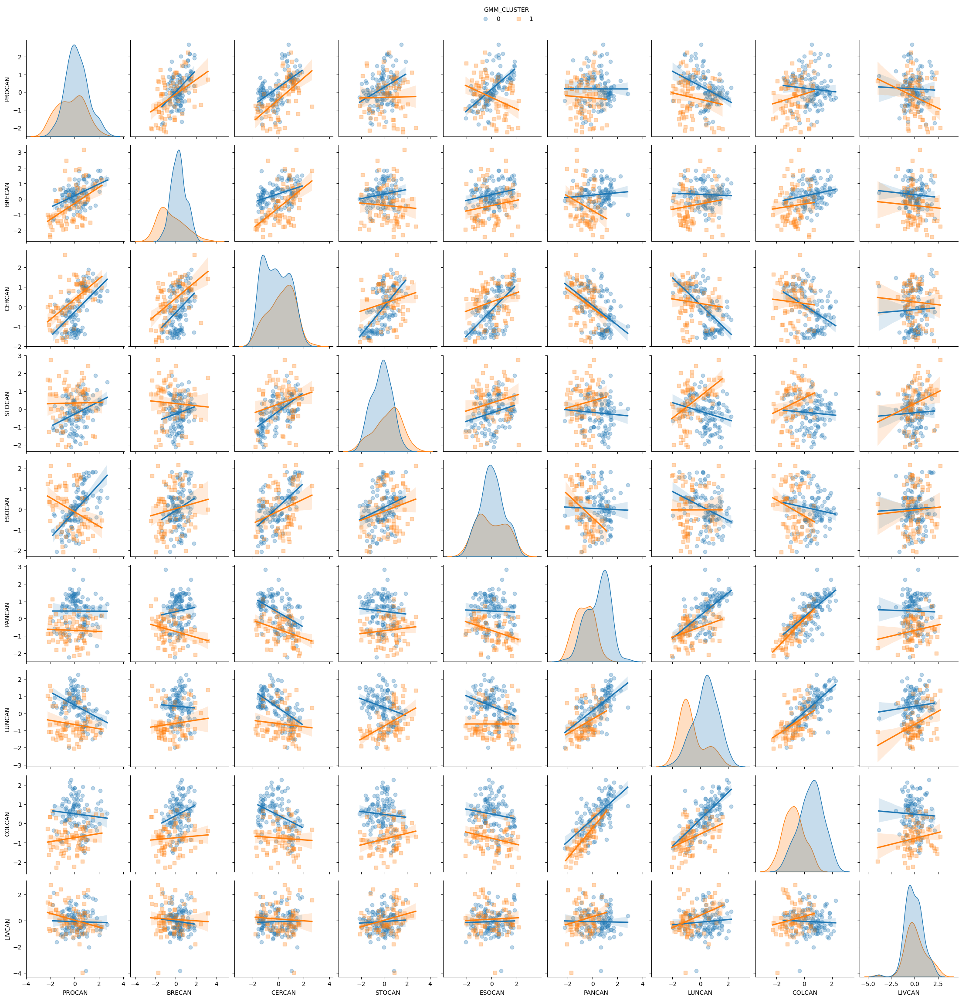

In [142]:
##################################
# Gathering the pairplot for all variables
# labelled using the final GMM Clustering model
##################################
df_gaussian_mixture_clustering_plot = sns.pairplot(df_gaussian_mixture_clustering,
                                                                  kind='reg',
                                                                  markers=["o", "s"],
                                                                  plot_kws={'scatter_kws': {'alpha': 0.3}},
                                                                  hue='GMM_CLUSTER');
sns.move_legend(df_gaussian_mixture_clustering_plot, 
                "lower center",
                bbox_to_anchor=(.5, 1), ncol=2, title='GMM_CLUSTER', frameon=False)
plt.show()

### 1.5.5 Agglomerative Clustering <a class="anchor" id="1.6.5"></a>

[Agglomerative Clustering](https://link.springer.com/book/10.1007/978-981-19-0420-2) builds a hierarchy of clusters. In this algorithm, each data point starts as its own cluster, and the algorithm merges clusters iteratively until a stopping criterion is met. The algorithm starts with each data point as a singleton cluster with the number of initial clusters is equal to the number of data points. The pairwise distance matrix is calculated between all clusters using complete linkage determined as the maximum distance between any two points in the two clusters. The two clusters that have the minimum distance according to the linkage criterion are identified and merged in the next step. The distances between new clusters and all other clusters are recalculated. All previous steps are repeated until the desired number of clusters is reached or until a stopping criterion is met.

[Silhouette Score](https://www.packtpub.com/product/training-systems-using-python-statistical-modeling/9781838823733) assesses the quality of clusters created by a clustering algorithm. It measures how well-separated the clusters are and how similar each data point in a cluster is to the other points in the same cluster compared to the nearest neighboring cluster. The silhouette score ranges from -1 to 1, where a higher value indicates better-defined clusters. The silhouette method requires the computation of the silhouette scores for each data point which is the average dissimilarity of the data point with all other data points in the next-nearest cluster minus the average dissimilarity of the data point to points in the same cluster and divided by the larger of the two numbers. The overall silhouette score for the clustering is the average of the silhouette scores for all data points.

1. The [agglomerative clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering) from the <mark style="background-color: #CCECFF"><b>sklearn.cluster</b></mark> Python library API was implemented. 
2. The model contains 2 hyperparameters:
    * <span style="color: #FF0000">n_cluster</span> = number of clusters to find made to vary between 2 to 9
    * <span style="color: #FF0000">linkage</span> = linkage criterion used to determine which distance to use between sets of observation held constant at a value equal to full (minimizes the maximum distance between observations of pairs of clusters)
3. Hyperparameter tuning was conducted on the data with optimal model performance using the silhouette score determined for: 
    * <span style="color: #FF0000">n_cluster</span> = 2
    * <span style="color: #FF0000">linkage</span> = full
4. The apparent model performance of the optimal model is summarized as follows:
    * **Silhouette Score** = 0.1629
    

In [143]:
##################################
# Fitting the Agglomerative Clustering algorithm
# using a range of K values
##################################
agglomerative_cluster_list = list()
agglomerative_cluster_silhouette_score = list()
for cluster_count in range(2,10):
    ag = AgglomerativeClustering(n_clusters=cluster_count, 
                                 linkage='complete')
    ag = ag.fit(df_premodelling_clustering)
    agglomerative_cluster_list.append(cluster_count)
    agglomerative_cluster_silhouette_score.append(silhouette_score(df_premodelling_clustering, 
                                                                   ag.fit_predict(df_premodelling_clustering), 
                                                                   metric='euclidean'))

In [144]:
##################################
# Consolidating the model performance metrics
# for the Agglomerative Clustering algorithm
# using a range of K values
##################################
agglomerative_clustering_evaluation_summary = pd.DataFrame(zip(agglomerative_cluster_list,
                                                               agglomerative_cluster_silhouette_score), 
                                                           columns=['Agglomerative.Cluster.Count',
                                                                    'Agglomerative.Cluster.Silhouette.Score'])
agglomerative_clustering_evaluation_summary

,Agglomerative.Cluster.Count,Agglomerative.Cluster.Silhouette.Score
0,2,0.1629
1,3,0.1311
2,4,0.1127
3,5,0.1617
4,6,0.2035
5,7,0.1995
6,8,0.2006
7,9,0.1968


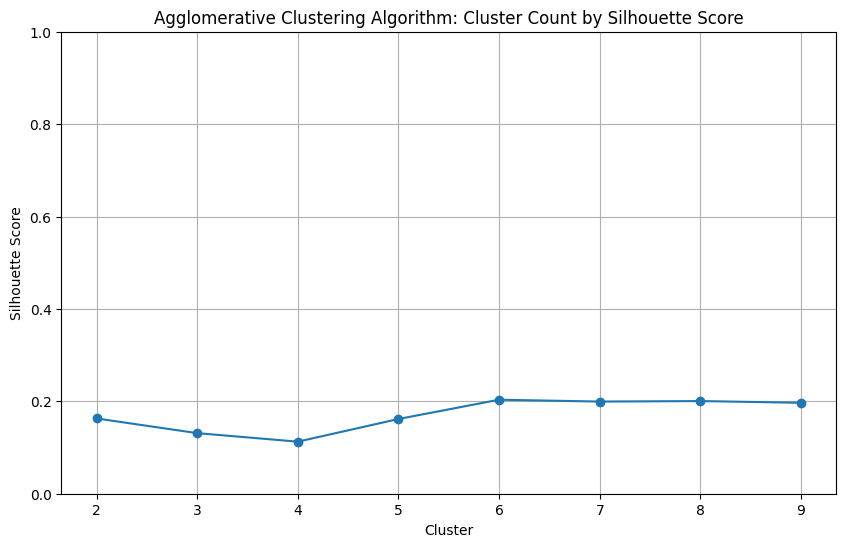

In [145]:
###################################
# Plotting the Silhouette Score performance
# by cluster count using a range of K values
# for the Agglomerative Clustering algorithm
##################################
agglomerative_cluster_count_values = np.array(agglomerative_clustering_evaluation_summary['Agglomerative.Cluster.Count'].values)
agglomerative_silhouette_score_values = np.array(agglomerative_clustering_evaluation_summary['Agglomerative.Cluster.Silhouette.Score'].values)
plt.figure(figsize=(10, 6))
plt.plot(agglomerative_cluster_count_values, agglomerative_silhouette_score_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(0,1)
plt.title("Agglomerative Clustering Algorithm: Cluster Count by Silhouette Score")
plt.xlabel("Cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [146]:
###################################
# Formulating the final Agglomerative Clustering model
# using the optimal cluster count
##################################
agglomerative_clustering = AgglomerativeClustering(n_clusters=2, 
                                                   linkage='complete')
agglomerative_clustering = agglomerative_clustering.fit(df_premodelling_clustering)

###################################
# Gathering the Silhouette Score
# for the final K-Means Clustering model
##################################
agglomerative_clustering_silhouette_score = silhouette_score(df_premodelling_clustering, agglomerative_clustering.labels_, metric='euclidean')

In [147]:
##################################
# Plotting the cluster labels
# for the final Agglomerative Clustering model
##################################
df_agglomerative_clustering = df_premodelling_clustering.copy()
df_agglomerative_clustering['AGGLOMERATIVE_CLUSTER'] = agglomerative_clustering.fit_predict(df_agglomerative_clustering)
df_agglomerative_clustering.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,AGGLOMERATIVE_CLUSTER
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059,1
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924,1
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914,0
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091,1
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379,0


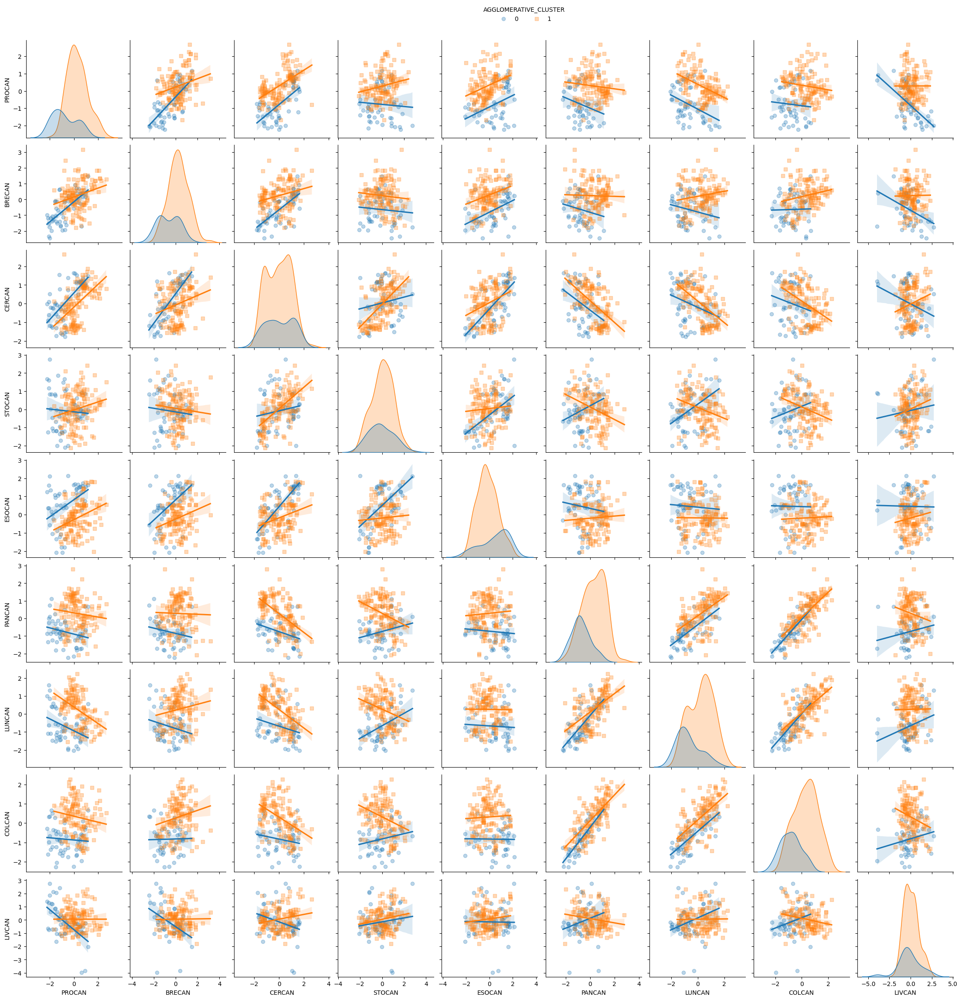

In [148]:
##################################
# Gathering the pairplot for all variables
# labelled using the final Agglomerative Clustering model
##################################
df_agglomerative_clustering_plot = sns.pairplot(df_agglomerative_clustering,
                                                               kind='reg',
                                                               markers=['o', 's'],
                                                               plot_kws={'scatter_kws': {'alpha': 0.3}},
                                                               hue='AGGLOMERATIVE_CLUSTER');
sns.move_legend(df_agglomerative_clustering_plot, 
                "lower center",
                bbox_to_anchor=(.5, 1), ncol=2, title='AGGLOMERATIVE_CLUSTER', frameon=False)
plt.show()

### 1.5.6 Ward Hierarchical Clustering

[Ward Hierarchical Clustering](https://link.springer.com/book/10.1007/978-981-19-0420-2) creates compact, well-separated clusters by minimizing the variance within each cluster during the merging process. In this algorithm, each data point starts as its own cluster, and the algorithm merges clusters iteratively until a stopping criterion is met. The algorithm starts with each data point as a singleton cluster with the number of initial clusters is equal to the number of data points. The pairwise distance matrix is calculated between all clusters and used as a measure of dissimilarity. For each cluster, the within-cluster variance is computed which evaluates how tightly the data points within a cluster are grouped. The two clusters that, when merged, result in the smallest increase in the within-cluster variance are identified and merged in the next step. The within-cluster variance for the newly formed cluster  are recalculated and the pairwise distance matrix updated. All previous steps are repeated until the desired number of clusters is reached or until a stopping criterion is met.

[Silhouette Score](https://www.packtpub.com/product/training-systems-using-python-statistical-modeling/9781838823733) assesses the quality of clusters created by a clustering algorithm. It measures how well-separated the clusters are and how similar each data point in a cluster is to the other points in the same cluster compared to the nearest neighboring cluster. The silhouette score ranges from -1 to 1, where a higher value indicates better-defined clusters. The silhouette method requires the computation of the silhouette scores for each data point which is the average dissimilarity of the data point with all other data points in the next-nearest cluster minus the average dissimilarity of the data point to points in the same cluster and divided by the larger of the two numbers. The overall silhouette score for the clustering is the average of the silhouette scores for all data points.

1. The [ward hierarchical clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering) from the <mark style="background-color: #CCECFF"><b>sklearn.cluster</b></mark> Python library API was implemented. 
2. The model contains 2 hyperparameters:
    * <span style="color: #FF0000">n_cluster</span> = number of clusters to find made to vary between 2 to 9
    * <span style="color: #FF0000">linkage</span> = linkage criterion used to determine which distance to use between sets of observation held constant at a value equal to ward (minimizes the sum of squared differences and variance within all clusters)
3. Hyperparameter tuning was conducted on the data with optimal model performance using the silhouette score determined for: 
    * <span style="color: #FF0000">n_cluster</span> = 2
    * <span style="color: #FF0000">linkage</span> = ward
4. The apparent model performance of the optimal model is summarized as follows:
    * **Silhouette Score** = 0.2148
    

In [149]:
##################################
# Fitting the Ward Hierarchical Clustering algorithm
# using a range of K values
##################################
ward_hierarchical_cluster_list = list()
ward_hierarchical_cluster_silhouette_score = list()
for cluster_count in range(2,10):
    wh = AgglomerativeClustering(n_clusters=cluster_count, 
                                 linkage='ward')
    wh = wh.fit(df_premodelling_clustering)
    ward_hierarchical_cluster_list.append(cluster_count)
    ward_hierarchical_cluster_silhouette_score.append(silhouette_score(df_premodelling_clustering, 
                                                                       wh.fit_predict(df_premodelling_clustering), 
                                                                       metric='euclidean'))

In [150]:
##################################
# Consolidating the model performance metrics
# for the Ward Hierarchical Clustering algorithm
# using a range of K values
##################################
ward_hierarchical_clustering_evaluation_summary = pd.DataFrame(zip(ward_hierarchical_cluster_list,
                                                                   ward_hierarchical_cluster_silhouette_score), 
                                                           columns=['Ward.Hierarchical.Cluster.Count',
                                                                    'Ward.Hierarchical.Cluster.Silhouette.Score'])
ward_hierarchical_clustering_evaluation_summary

,Ward.Hierarchical.Cluster.Count,Ward.Hierarchical.Cluster.Silhouette.Score
0,2,0.2148
1,3,0.1924
2,4,0.1840
3,5,0.1714
4,6,0.1858
5,7,0.1803
6,8,0.1595
7,9,0.1689


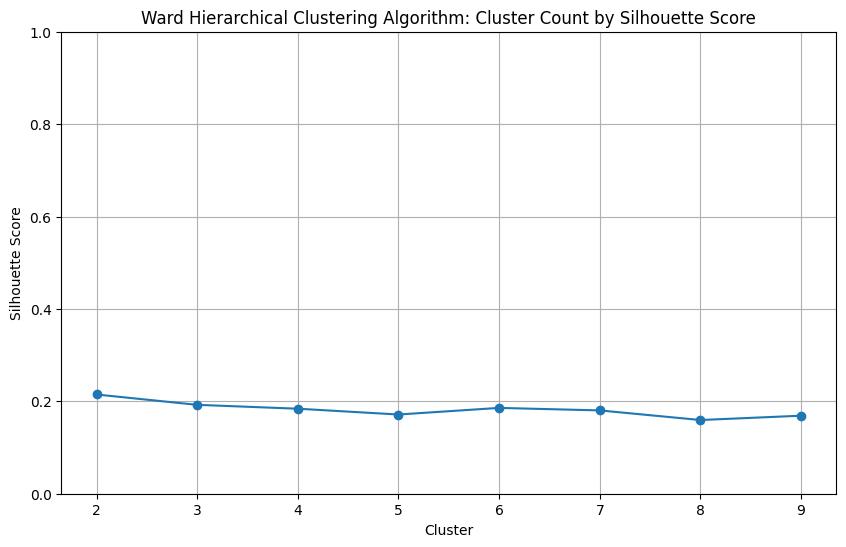

In [151]:
###################################
# Plotting the Silhouette Score performance
# by cluster count using a range of K values
# for the Ward Hierarchical Clustering algorithm
##################################
ward_hierarchical_cluster_count_values = np.array(ward_hierarchical_clustering_evaluation_summary['Ward.Hierarchical.Cluster.Count'].values)
ward_hierarchical_silhouette_score_values = np.array(ward_hierarchical_clustering_evaluation_summary['Ward.Hierarchical.Cluster.Silhouette.Score'].values)
plt.figure(figsize=(10, 6))
plt.plot(ward_hierarchical_cluster_count_values, ward_hierarchical_silhouette_score_values, marker='o',ls='-')
plt.grid(True)
plt.ylim(0,1)
plt.title("Ward Hierarchical Clustering Algorithm: Cluster Count by Silhouette Score")
plt.xlabel("Cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [152]:
###################################
# Formulating the final Ward Hierarchical Clustering model
# using the optimal cluster count
##################################
ward_hierarchical_clustering = AgglomerativeClustering(n_clusters=2, 
                                                       linkage='ward')
ward_hierarchical_clustering = agglomerative_clustering.fit(df_premodelling_clustering)

###################################
# Gathering the Silhouette Score
# for the final Ward Hierarchical model
##################################
ward_hierarchical_clustering_silhouette_score = silhouette_score(df_premodelling_clustering, ward_hierarchical_clustering.labels_, metric='euclidean')

In [153]:
##################################
# Plotting the cluster labels
# for the final Ward Hierarchical Clustering model
##################################
df_ward_hierarchical_clustering = df_premodelling_clustering.copy()
df_ward_hierarchical_clustering['WARD_HIERARCHICAL_CLUSTER'] = ward_hierarchical_clustering.fit_predict(df_ward_hierarchical_clustering)
df_ward_hierarchical_clustering.head()

,PROCAN,BRECAN,CERCAN,STOCAN,ESOCAN,PANCAN,LUNCAN,COLCAN,LIVCAN,WARD_HIERARCHICAL_CLUSTER
0,-0.6922,-0.4550,-0.1771,2.0964,0.9425,-1.4794,-0.6095,-0.9258,1.4059,1
1,-0.0867,-1.3608,-1.1020,0.3084,-1.4329,0.2506,0.8754,-0.7177,0.8924,1
2,-1.0261,-0.8704,-0.8184,-1.2331,-1.8001,-0.6858,-0.9625,-1.0428,-1.1914,0
3,0.0691,-0.3352,-0.8866,-0.1990,0.0272,1.2933,1.3658,1.5903,1.3091,1
4,0.5801,0.3703,1.0686,-0.0427,1.2150,-1.1052,-0.2718,-0.5826,-0.8379,0


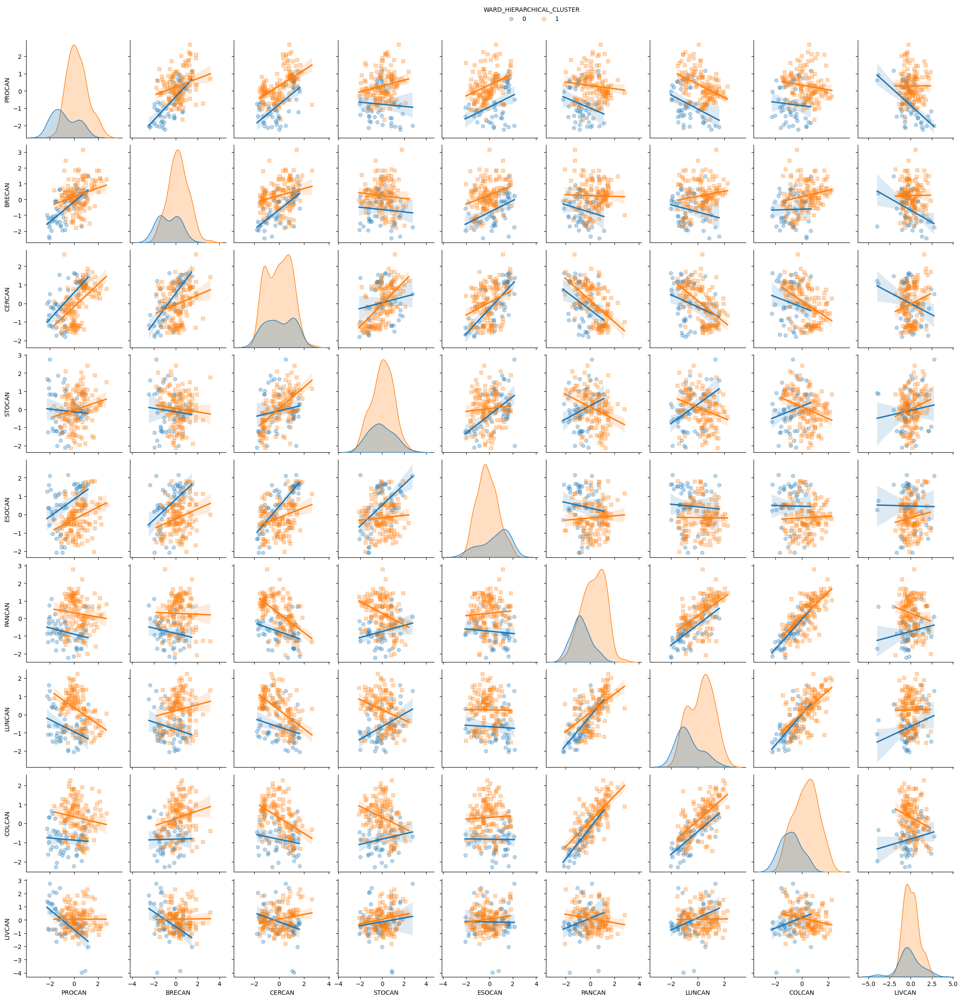

In [154]:
##################################
# Gathering the pairplot for all variables
# labelled using the final Ward Hierarchical Clustering model
##################################
df_ward_hierarchical_clustering_plot = sns.pairplot(df_ward_hierarchical_clustering,
                                                                   kind='reg',
                                                                   markers=["o", "s"],
                                                                   plot_kws={'scatter_kws': {'alpha': 0.3}},
                                                                   hue='WARD_HIERARCHICAL_CLUSTER');
sns.move_legend(df_ward_hierarchical_clustering_plot, 
                "lower center",
                bbox_to_anchor=(.5, 1), ncol=2, title='WARD_HIERARCHICAL_CLUSTER', frameon=False)
plt.show()

## 1.6. Consolidated Findings

1. Among the range of cluster counts evaluated, the [k-means clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) with 2 clusters provided the most compact intra-cluster and differential inter-cluster segmentation of countries:
    * **Silhouette Score** = 0.2355
2. Among the range of cluster counts evaluated, the [bisecting k-means clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.BisectingKMeans.html#sklearn.cluster.BisectingKMeans) with 2 clusters provided the most compact intra-cluster and differential inter-cluster segmentation of countries:
    * **Silhouette Score** = 0.2355
3. Among the range of cluster counts evaluated, the [gaussian mixture clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.mixture.GaussianMixture.html#sklearn.mixture.GaussianMixture) with 2 clusters provided the most compact intra-cluster and differential inter-cluster segmentation of countries:
    * **Silhouette Score** = 0.2239
4. Among the range of cluster counts evaluated, the [agglomerative clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering) with 2 clusters provided the most compact intra-cluster and differential inter-cluster segmentation of countries:
    * **Silhouette Score** = 0.1629
5. Among the range of cluster counts evaluated, the [ward hierarchical clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering) with 2 clusters provided the most compact intra-cluster and differential inter-cluster segmentation of countries:
    * **Silhouette Score** = 0.2148    
6. Comparing all results from the clustering models formulated, the [k-means clustering model](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans) which demonstrated the highest silhouette score was selected as the final model for segmenting the countries based on similar characteristics. 
    * **Silhouette Score** = 0.2355   
7. Given the final model, the following segmented groupings were observed from the formulated clusters:  
    * **Cluster 0: HIGH_PAN_LUN_COL_LIV_CAN** composed of countries characterized by:
        * Higher death rates for pancreatic, lung, colon and liver cancers
        * Lower death rates for prostate, breast, cervical, stomach and esophageal cancers
        * Higher smoking prevalence, overweight prevalence and alcohol consumption
        * Predominantly from North America, Europe, West Asia, Central Asia, East Asia, Southeast Asia and Australia regions
    * **Cluster 1: HIGH_PRO_BRE_CER_STO_ESO_CAN** composed of countries characterized by:
        * Higher death rates for prostate, breast, cervical, stomach and esophageal cancers
        * Lower death rates for pancreatic, lung, colon and liver cancers
        * Lower smoking prevalence, overweight prevalence and alcohol consumption
        * Predominantly from South America, South Asia and Africa regions
        

In [155]:
##################################
# Consolidating all the
# model performance measures
##################################
clustering_silhouette_score_list = [kmeans_clustering_silhouette_score,
                                    bisecting_kmeans_clustering_silhouette_score,
                                    gaussian_mixture_clustering_silhouette_score,
                                    agglomerative_clustering_silhouette_score,
                                    ward_hierarchical_clustering_silhouette_score]
clustering_silhouette_algorithm_list = ['kmeans_clustering',
                                        'bisecting_kmeans_clustering',
                                        'gaussian_mixture_clustering',
                                        'agglomerative_clustering',
                                        'ward_hierarchical_clustering']
performance_comparison_silhouette_score = pd.DataFrame(zip(clustering_silhouette_algorithm_list,
                                                           clustering_silhouette_score_list), 
                                                       columns=['Clustering.Algorithm',
                                                                'Silhouette.Score'])
print('Consolidated Model Performance: ')
display(performance_comparison_silhouette_score)

Consolidated Model Performance: 


,Clustering.Algorithm,Silhouette.Score
0,kmeans_clustering,0.2350
1,bisecting_kmeans_clustering,0.2350
2,gaussian_mixture_clustering,0.1422
3,agglomerative_clustering,0.1629
4,ward_hierarchical_clustering,0.1629


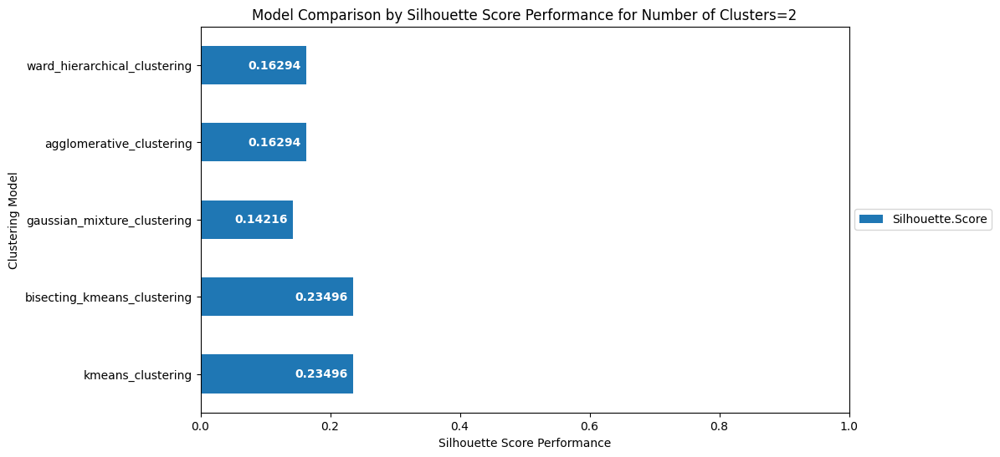

In [156]:
##################################
# Plotting all the Silhouette Score
# model performance measures
##################################
performance_comparison_silhouette_score.set_index('Clustering.Algorithm', inplace=True)
performance_comparison_silhouette_score_plot = performance_comparison_silhouette_score.plot.barh(figsize=(10, 6))
performance_comparison_silhouette_score_plot.set_xlim(0.00,1.00)
performance_comparison_silhouette_score_plot.set_title("Model Comparison by Silhouette Score Performance for Number of Clusters=2")
performance_comparison_silhouette_score_plot.set_xlabel("Silhouette Score Performance")
performance_comparison_silhouette_score_plot.set_ylabel("Clustering Model")
performance_comparison_silhouette_score_plot.grid(False)
performance_comparison_silhouette_score_plot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
for container in performance_comparison_silhouette_score_plot.containers:
    performance_comparison_silhouette_score_plot.bar_label(container, fmt='%.5f', padding=-50, color='white', fontweight='bold')

# 2. Key Findings

### Model Performance Summary

Based on these Silhouette scores:

**K-means** exhibited the best performance among the three models with a score of `0.2350`. While this score is positive, it also suggests that the clusters might not be very well separated.
**Agglomerative Clustering** and **Gaussian Mixture Clustering** showed similar, relatively poor performance with scores of `0.1629` and `0.142`2 respectively. This indicates significant overlap between clusters and potentially suboptimal model fit.

# 3. Next Step

### Algorithm Selection and Hyperparameter Tuning
**Try Different Clustering Algorithms:** Experiment with algorithms like `DBSCAN`, `HDBSCAN`, or `OPTICS`, which are known for handling complex data distributions.  
**Optimize Hyperparameters:** Fine-tune the parameters of the current and new algorithms to find the best configuration for your data. Utilize techniques like grid search or randomized search.  

### Cluster Evaluation and Validation
**Evaluate Cluster Stability:** Assess how sensitive the clusters are to changes in data or parameters. Techniques like silhouette analysis, Calinski-Harabasz index, and Davies-Bouldin index can be used.  
**Consider Domain Knowledge:** Involve domain experts to validate the clustering results and provide insights into potential cluster interpretations.  

### Additional Considerations
**Determine Optimal Number of Clusters:** Use techniques like the elbow method, silhouette analysis, or gap statistic to find the appropriate number of clusters for each algorithm.  
**Assess Data Characteristics:** Understand the nature of your data (e.g., high dimensionality, noise, imbalanced classes) to choose suitable clustering algorithms and preprocessing techniques.  

### Iterative Approach
Clustering is often an iterative process. It's essential to try different combinations of algorithms, hyperparameters, and data preprocessing techniques to find the best solution for your specific problem.